# Joint seismic interpolation and deghosting with Deep Preconditioners

## Author: M.Ravasi

This notebook presents an example of Deep Preconditioned inversion for seismic applications, more specifically to `interpolate and deghost` seismic shot gathers. 

The overall procedure is divided into two phases:

- Representation learning: given patches of the recorded data (in common-receiver domain, an AutoEncoder is trained to identify a strong latent representation of such a dataset;
- Physics-driven inversion: the trained Decoder is now used as a nonlinear preconditioner to the solution of the joint interpolation and deghosting problem.

We will be applying here the procedure to a synthetic dataset created from a simple layered geology with a syncline as shown below.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import os
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import pylops

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.sparse import csr_matrix, vstack
from scipy.signal import filtfilt, convolve
from scipy.linalg import lstsq, solve
from scipy.sparse.linalg import LinearOperator, cg, lsqr
from scipy import misc
from torchsummary import summary

from pylops.utils import dottest
from pylops.utils.wavelets import *
from pylops.utils.tapers import *
from pylops.basicoperators import *
from pylops.signalprocessing import *
from pylops.waveeqprocessing.oneway import PhaseShift, Deghosting
from pylops.optimization.sparsity  import *

from pylops_gpu import TorchOperator
from pylops_gpu import Restriction as gRestriction

from deepprecs.ghost import deghosting
from deepprecs.patching import patching, patch_scalings
from deepprecs.subsampling import subsampling 
from deepprecs.utils import set_seed
from deepprecs.model import AutoencoderBase, AutoencoderRes, AutoencoderMultiRes
from deepprecs.train import Train
from deepprecs.invert import InvertAll

## Parameters

In [2]:
################# GLOBAL ####################
# Device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
if 'cuda' in str(device):
    import cupy as cp

# Seed
set_seed(5)

# Input filepath
inputfile = '../../data/syncline/input.npz'

# Model and figure directories
label = 'syncline'
outputmodels = f'../../models/{label}'
outputfigs = f'../../figures/{label}'

################# TRAINING ####################

# Patches
nspatch, ntpatch = 64, 64
nsjump, ntjump = 32, 32


"""
# Experiment number and name
iexp = 1
expname = 'Deep network with more filters and more levels 300enc - mse cost'

# AE parameters
aetype = AutoencoderBase # AE type: AutoencoderBase, AutoencoderRes, AutoencoderMultiRes
nenc = 300 # Size of latent space
kernel_size = 5 # Size of filters kernels
nfilts = 64 # number of filters for conv layers in first level (doubles up going down)
nlayers = 2 # number of layers per level 
nlevels = 3 # number of levels
convbias = True # add bias to convolution layers 
downstride = 2 # stride of downsampling/pooling blocks (same will be used for upsampling blocks)
downmode = 'max' # type of pooling (avg or max)
upmode = 'upsample' # type of upsampling (convtransp, upsample or upsample1d)
bnormlast = True # add batch normalization to the last layer
act_fun = 'LeakyReLU' # activation function for all hidden layers
relu_enc = False # add ReLU activation to the linear layer of the encoder (this and tanh_enc cannot be both true)
tanh_enc = True # add TanH activation to the linear layer of the encoder
relu_dec = True # add ReLU activation to the linear layer of the decoder
tanh_final = False # add TanH activation to the last layer of the network - ensures the output is bounded between [-1, 1]

# Loss/Optimizer
loss = 'mse' # loss: mse, weightmse, l1, ssim, peaerson, mse_pearson, l1_pearson, ccc, mse_ccc, l1_ccc
lossweights = None # weights to apply to different losses when using multiple losses - if None, learned
betas = (0.9, 0.999) # betas of Adam optimizer
weight_decay = 1e-5 # weigth decay of Adam optimizer
learning_rate = 1e-3 # learning rate of Adam optimizer
adapt_learning = True # apply adaptive learning rate
lr_scheduler = 'OnPlateau' # type of adaptive learning rate: OnPlateau, OneCycleLR
lr_factor = 0.1 # lr factor for OnPlateau
lr_thresh = 0.0001 # lr thresh for OnPlateau
lr_patience = 5 # lr patience for OnPlateau
lr_max = None # lr max for OneCycleLR
early_stop = True # apply early stopping
es_patience = 10 # early stopping patience

# Training
num_epochs = 20 # number of epochs
batch_size = 256 # batch size
noise_std = 0.0 # standard deviation noise to input
mask_perc = 0. # percentage of traces to mask

# Miscellaneous
plotflag = True # visualize intermediate training results
loadmodel = False # load pretrained model with number of iexp


# Experiment number and name
iexp = 2
expname = 'ResNet network with more filters 300enc - mse cost'

# AE parameters
aetype = AutoencoderRes # AE type: AutoencoderBase, AutoencoderRes, AutoencoderMultiRes
nenc = 300 # Size of latent space
kernel_size = 5 # Size of filters kernels
nfilts = 32 # number of filters for conv layers in first level (doubles up going down)
nlayers = 2 # number of layers per level 
nlevels = 2 # number of levels
convbias = True # add bias to convolution layers 
downstride = 1 # stride of downsampling/pooling blocks (same will be used for upsampling blocks)
downmode = 'max' # type of pooling (avg or max)
upmode = 'upsample' # type of upsampling (convtransp, upsample or upsample1d)
bnormlast = True # add batch normalization to the last layer
act_fun = 'LeakyReLU' # activation function for all hidden layers
relu_enc = False # add ReLU activation to the linear layer of the encoder (this and tanh_enc cannot be both true)
tanh_enc = True # add TanH activation to the linear layer of the encoder
relu_dec = True # add ReLU activation to the linear layer of the decoder
tanh_final = False # add TanH activation to the last layer of the network - ensures the output is bounded between [-1, 1]

# Loss/optimizer
loss = 'mse' # loss: mse, weightmse, l1, ssim, peaerson, mse_pearson, l1_pearson, ccc, mse_ccc, l1_ccc
lossweights = None
betas = (0.9, 0.999) # betas of Adam optimizer
weight_decay = 1e-5 # weigth decay of Adam optimizer
learning_rate = 1e-3 # learning rate of Adam optimizer
adapt_learning = True # apply adaptive learning rate
lr_scheduler = 'OnPlateau' # type of adaptive learning rate: OnPlateau, OneCycleLR
lr_factor = 0.1 # lr factor for OnPlateau
lr_thresh = 0.0001 # lr thresh for OnPlateau
lr_patience = 5 # lr patience for OnPlateau
lr_max = None # lr max for OneCycleLR
early_stop = True # apply early stopping
es_patience = 10 # early stopping patience

# Training
num_epochs = 20 # number of epochs
batch_size = 256 # batch size
noise_std = 0.0 # standard deviation noise to input
mask_perc = 0. # percentage of traces to mask

# Miscellaneous
plotflag = True # visualize intermediate training results
loadmodel = False # load pretrained model with number of iexp
"""

# Experiment number and name
iexp = 3
expname = 'ResNet network with more filters 300enc - mse+ccc cost with learned weigths + mask'

# AE parameters
aetype = AutoencoderRes # AE type: AutoencoderBase, AutoencoderRes, AutoencoderMultiRes
nenc = 300 # Size of latent space
kernel_size = 5 # Size of filters kernels
nfilts = 32 # number of filters for conv layers in first level (doubles up going down)
nlayers = 2 # number of layers per level 
nlevels = 2 # number of levels
convbias = True # add bias to convolution layers 
downstride = 1 # stride of downsampling/pooling blocks (same will be used for upsampling blocks)
downmode = 'max' # type of pooling (avg or max)
upmode = 'upsample' # type of upsampling (convtransp, upsample or upsample1d)
bnormlast = True # add batch normalization to the last layer
act_fun = 'LeakyReLU' # activation function for all hidden layers
relu_enc = False # add ReLU activation to the linear layer of the encoder (this and tanh_enc cannot be both true)
tanh_enc = True # add TanH activation to the linear layer of the encoder
relu_dec = True # add ReLU activation to the linear layer of the decoder
tanh_final = False # add TanH activation to the last layer of the network - ensures the output is bounded between [-1, 1]

# Loss/optimizer
loss = 'mse_ccc' # loss: mse, weightmse, l1, ssim, peaerson, mse_pearson, l1_pearson, ccc, mse_ccc, l1_ccc
lossweights = None
betas = (0.5, 0.9) # betas of Adam optimizer
weight_decay = 1e-5 # weigth decay of Adam optimizer
learning_rate = 1e-4 # learning rate of Adam optimizer
adapt_learning = True # apply adaptive learning rate
lr_scheduler = 'OneCycle' # type of adaptive learning rate: OnPlateau, OneCycleLR
lr_factor = None # lr factor for OnPlateau
lr_thresh = None # lr thresh for OnPlateau
lr_patience = None # lr patience for OnPlateau
lr_max = 1e-3 # lr max for OneCycleLR
early_stop = True # apply early stopping
es_patience = 10 # early stopping patience

# Training
num_epochs = 40 # number of epochs
batch_size = 256 # batch size
noise_std = 0.0 # standard deviation noise to input
mask_perc = 0.2 # percentage of traces to mask

# Miscellaneous
plotflag = True # visualize intermediate training results
loadmodel = False # load pretrained model with number of iexp


####### DEGHOSTING AND INTERPOLATION #######
# Source index to be used for inversion
isrc_rec = 100

# Direct wave window
toff = 0.06 # time offset
nsmoothwin = 5 # size of smoothing to apply to window

# Ghost  operator
vel_sep = 1500.0 # velocity at separation level
rho_sep = 1000.0 # density at separation level
nxpad = 20 # size of padding along x-axis prior to applying ghost model
ntaper = 11 # size of spatial taper along-x axis prior to applying ghost model

# Restriction operator
kind = 'irreg'
perc = 0.4

# Patching operator
nwin = (nspatch, ntpatch)
nover = (19, 8)
nop = (nspatch, ntpatch)
npatches = (4, 16)

cuda:0


## Load data

Let's start by importing the dataset we are going to use for this example

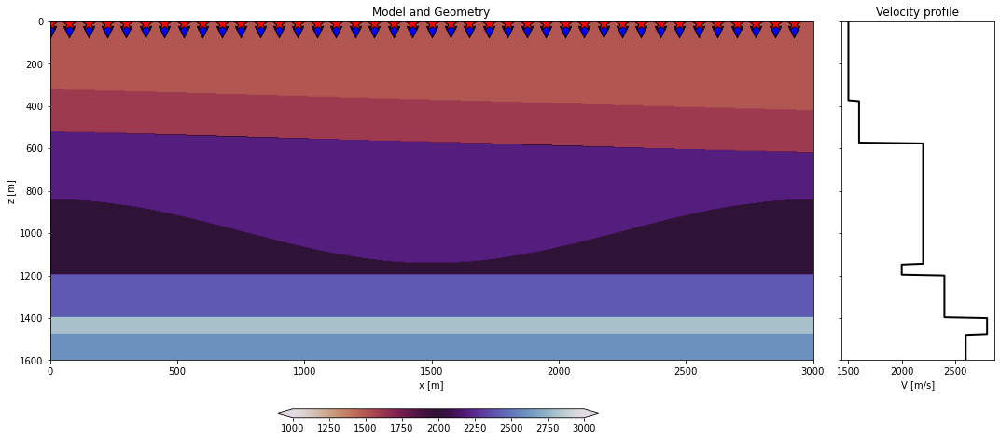

In [3]:
inputdata = np.load(inputfile)

# Receivers
r = inputdata['r'][:, :199]
nr = r.shape[1]
dr = r[0, 1] - r[0, 0]

# Sources
s = inputdata['s'][:, :199]
ns = s.shape[1]

# Model
rho = inputdata['rho']
vel = inputdata['vel']

# Axes
t = inputdata['t']
x, z = inputdata['x'], inputdata['z']
nt, dt = len(t), t[1]-t[0]
dx, dz = x[1] - x[0], z[1] - z[0]

# Load data
p = inputdata['p'][:199, :, :199].transpose(0, 2, 1)
p /= p.max()

# Convolve with wavelet
fwav = 15
wav, _, wav_c = ricker(t[:201], fwav)
p = np.apply_along_axis(convolve, -1, p, wav, mode='full')
p = p[:, :, wav_c:][:, :, :nt]

# Visualize
fig, axs = plt.subplots(1, 2, figsize=(15, 6), sharey=True, gridspec_kw={'width_ratios': [5, 1]})
axins1 = inset_axes(axs[0],
                    width="70%",  # width = 50% of parent_bbox width
                    height="5%",  # height : 5%
                    bbox_to_anchor=(0.125, -0.63, .6, .5),
                    bbox_transform=axs[0].transAxes)
im = axs[0].imshow(vel, extent = (x[0], x[-1], z[-1], z[0]), vmin=1000, vmax=3000, cmap='twilight_r')
axs[0].scatter(r[0, ::5],  r[1, ::5], marker='v', s=150, c='b', edgecolors='k')
axs[0].scatter(s[0, ::5], s[1, ::5], marker='*', s=250, c='r', edgecolors='k')
axs[0].axis('tight')
axs[0].set_xlabel('x [m]')
axs[0].set_ylabel('z [m]')
axs[0].set_title('Model and Geometry')
axs[0].set_xlim(x[0], x[-1])
axs[0].set_ylim(z[-1], z[0])
fig.colorbar(im, cax=axins1, orientation='horizontal', extend="both", fraction=0.046, pad=0.12) 
axs[1].plot(vel[:, len(x)//2], z, 'k', lw=2)
axs[1].set_title('Velocity profile')
axs[1].set_xlabel('V [m/s]')
plt.tight_layout()
plt.savefig(os.path.join(outputfigs, f'{label}_model.eps'), dpi=100, bbox_inches='tight')

## Deghosting problem

Before we start our training process, let's define the ghosting and restriction operators to be used in the subsequent inversion process. 

We will provide our network with such an operator so that later we can apply it directly to the output of its decoder

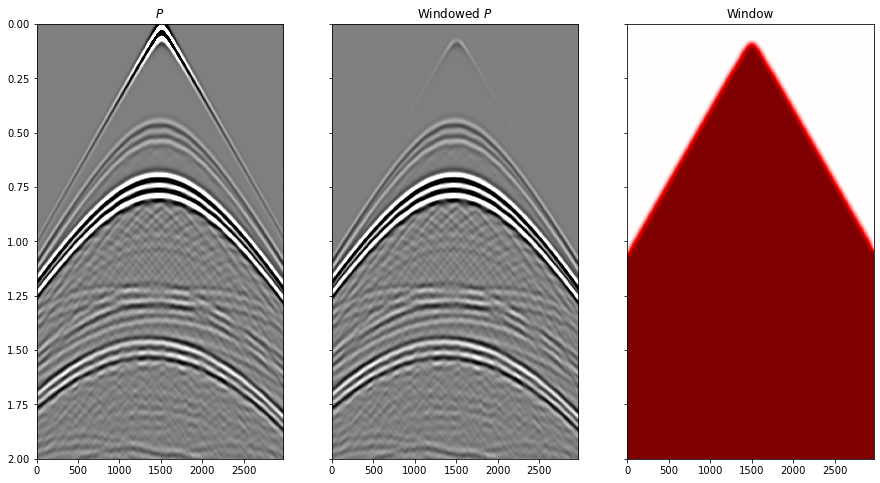

In [4]:
# Ghost operator
win, Dupop = deghosting(s, r, isrc_rec, nt, dt, dz, vel_sep, toff, nsmoothwin, nxpad, ntaper)

# Visualize
clip = 0.05
fig, axs = plt.subplots(1, 3, sharey=True, figsize=(15, 8))
axs[0].imshow(p[isrc_rec].T, cmap='gray', 
              vmin=-clip*np.abs(p).max(), vmax=clip*np.abs(p).max(),
              extent=(r[0, 0], r[0, -1], t[-1], t[0]))
axs[0].set_title(r'$P$')
axs[0].axis('tight')
axs[1].imshow(win * p[isrc_rec].T, cmap='gray', 
              vmin=-clip*np.abs(p).max(), vmax=clip*np.abs(p).max(),
              extent=(r[0, 0], r[0, -1], t[-1], t[0]))
axs[1].set_title(r'Windowed $P$')
axs[1].axis('tight')
axs[1].set_ylim(2, 0)
axs[2].imshow(win, cmap='seismic', vmin=-1, vmax=1,
              extent=(r[0, 0], r[0, -1], t[-1], t[0]))
axs[2].set_title(r'Window')
axs[2].axis('tight')
axs[2].set_ylim(2, 0);

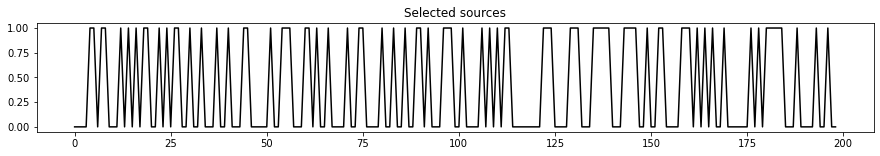

In [5]:
# Restriction operator
iava, mask = subsampling(ns, kind=kind, perc=perc)
Rop = Restriction(ns*nt, iava, dims=(ns, nt), dir=0, dtype='float32')

plt.figure(figsize=(15, 2))
plt.plot(mask, 'k')
plt.title('Selected sources');

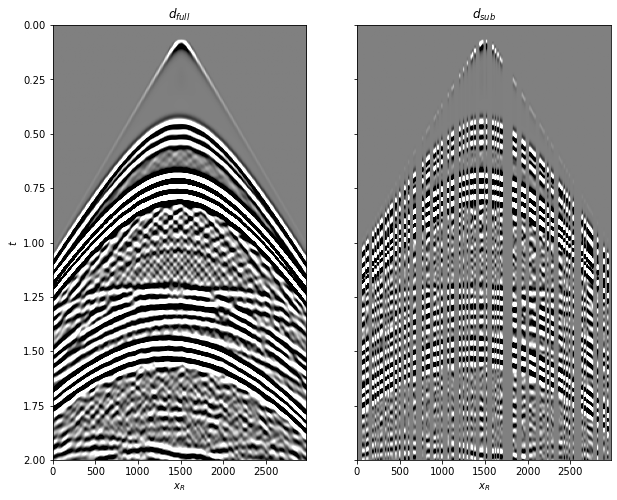

In [6]:
# Create full  and masked data
dfull = win.T * p[isrc_rec] 
d = Rop * dfull.ravel()

dmask = Rop.H * d
dmask = dmask.reshape(nr, nt)

# Convert data to torch
d_torch = torch.from_numpy(d.astype(np.float32)).to(device)
dmask_torch = torch.from_numpy(dmask.astype(np.float32)).to(device)

# Visualize
fig, axs = plt.subplots(1, 2, sharey=True, figsize=(10, 8))
axs[0].imshow(dfull.T, cmap='gray',  
              vmin=-clip*np.abs(dfull).max(), vmax=clip*np.abs(dfull).max(), 
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[0].set_title(r'$d_{full}$')
axs[0].set_xlabel(r'$x_R$')
axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(dmask.T, cmap='gray', 
              vmin=-clip*np.abs(dfull).max(), vmax=clip*np.abs(dfull).max(),
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[1].set_title(r'$d_{sub}$')
axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[1].set_ylim(2, 0);

  960 1024]


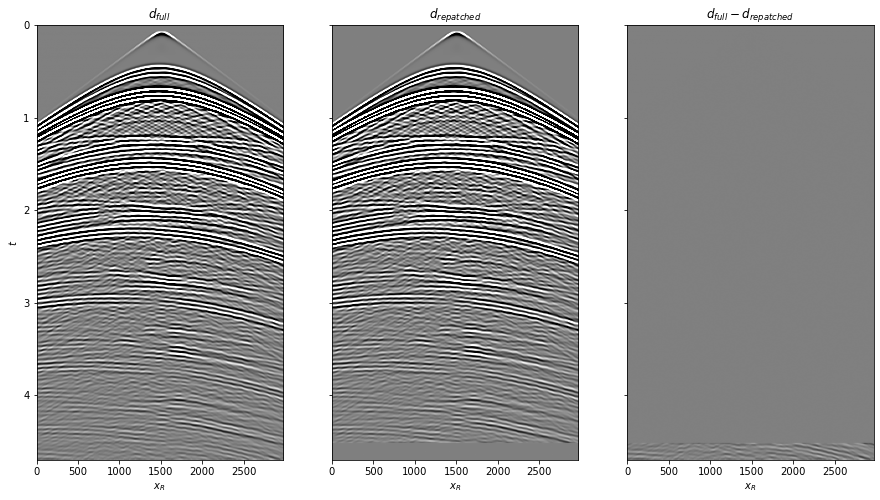

In [7]:
# Patch operator
dimsd = (ns, nt)
dims = (npatches[0]*nspatch, npatches[1]*ntpatch)

Op = Identity(nspatch*ntpatch, dtype='float32')
Pop = Patch2D(Op, dims, dimsd, nwin, nover, nop,
              tapertype=None, design=True)
Pop1 = Patch2D(Op.H, dims, dimsd, nwin, nover, nop,
              tapertype='cosine', design=False)
Pop1_torch = TorchOperator(Pop1, pylops=True, device=device)

# Create patches and revert back
dfull_patches = Pop.H * dfull.ravel()
dfull_patches = dfull_patches.reshape(dims)
dfull_repatched = Pop1 * dfull_patches.ravel()
dfull_repatched = dfull_repatched.reshape(dimsd)

# Visualize
fig, axs = plt.subplots(1, 3, sharey=True, figsize=(15, 8))
axs[0].imshow(dfull.T, cmap='gray',  
              vmin=-clip*np.abs(dfull).max(), vmax=clip*np.abs(dfull).max(), 
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[0].set_title(r'$d_{full}$')
axs[0].set_xlabel(r'$x_R$')
axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(dfull_repatched.T, cmap='gray', 
              vmin=-clip*np.abs(dfull).max(), vmax=clip*np.abs(dfull).max(),
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[1].set_title(r'$d_{repatched}$')
axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[1].set_ylim(2, 0)
axs[2].imshow(dfull.T-dfull_repatched.T, cmap='gray', 
              vmin=-clip*np.abs(dfull).max(), vmax=clip*np.abs(dfull).max(),
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[2].set_title(r'$d_{full}-d_{repatched}$')
axs[2].set_xlabel(r'$x_R$')
axs[2].axis('tight');

Scalings tensor([1.0000, 0.0312, 0.1853, 0.1966, 0.1968, 0.0872, 0.0862, 0.0406, 0.0480,
        0.0190, 0.0241, 0.0099, 0.0110, 0.0110, 0.0076, 0.0060, 0.0275, 0.0372,
        0.2214, 0.2008, 0.0636, 0.0775, 0.0329, 0.0539, 0.0329, 0.0367, 0.0367,
        0.0160, 0.0172, 0.0104, 0.0086, 0.0073, 0.0275, 0.0372, 0.2214, 0.2034,
        0.0619, 0.1001, 0.0329, 0.0534, 0.0402, 0.0367, 0.0367, 0.0196, 0.0243,
        0.0112, 0.0117, 0.0104, 1.0000, 0.0300, 0.1797, 0.1854, 0.2039, 0.1001,
        0.0832, 0.0338, 0.0444, 0.0368, 0.0196, 0.0199, 0.0124, 0.0116, 0.0105,
        0.0104], device='cuda:0')


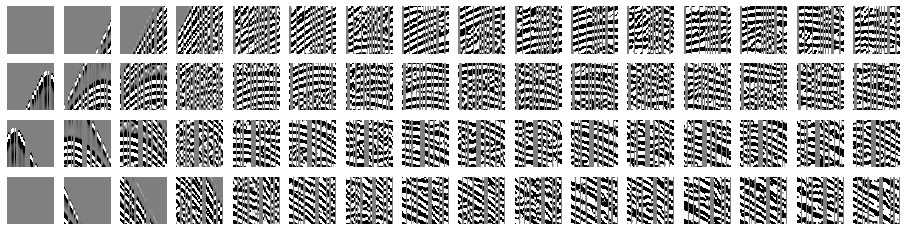

In [8]:
# Find scalings
scalings = patch_scalings(dmask, Pop, npatches, npatch=(nspatch, ntpatch), 
                          plotflag=True, clip=clip, device=device)


In [9]:
# Overall operator
RDupop = Rop * Dupop
RDupop_torch = TorchOperator(RDupop, pylops=True, device=device);

## Dataset generation

Let's now generate the training dataset by patching up the available seismic data

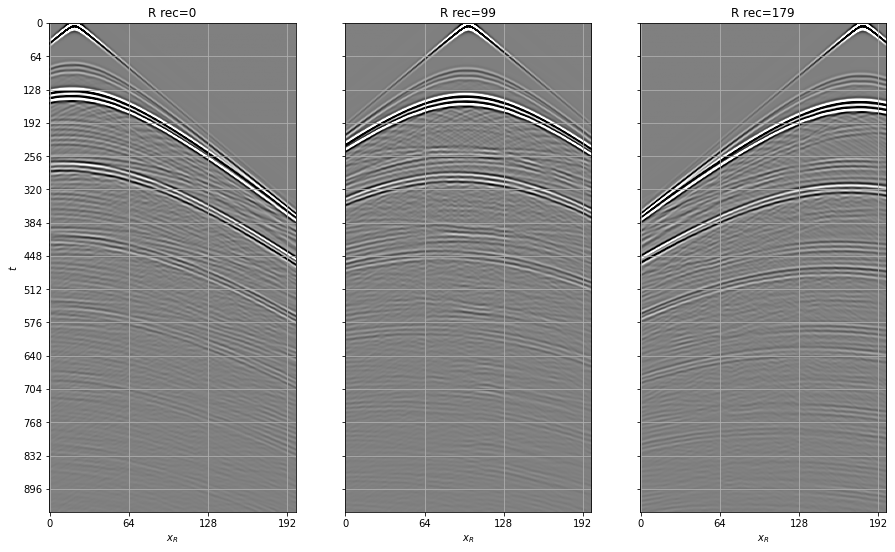

In [10]:
# Visualize receiver gathers
cmax = 0.1

fig, axs = plt.subplots(1, 3, sharey=True, figsize=(15, 9))
axs[0].imshow(p[:, 20].T, cmap='gray', vmin=-clip*np.abs(p).max(), vmax=clip*np.abs(p).max())
axs[0].set_title('R rec=0'), axs[0].set_xlabel(r'$x_R$'), axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[0].set_xticks(np.arange(0, nr, nspatch))
axs[0].set_yticks(np.arange(0, nt, ntpatch))
axs[0].grid(which='both');
axs[1].imshow(p[:, nr//2].T, cmap='gray', vmin=-clip*np.abs(p).max(), vmax=clip*np.abs(p).max())
axs[1].set_title('R rec=%d' %(nr//2)), axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[1].set_xticks(np.arange(0, nr, nspatch))
axs[1].set_yticks(np.arange(0, nt, ntpatch))
axs[1].grid(which='both');
axs[2].imshow(p[:, -20].T, cmap='gray', vmin=-clip*np.abs(p).max(), vmax=clip*np.abs(p).max())
axs[2].set_title('R rec=%d' %(nr-20)), axs[2].set_xlabel(r'$x_R$')
axs[2].axis('tight');
axs[2].set_xticks(np.arange(0, nr, nspatch))
axs[2].set_yticks(np.arange(0, nt, ntpatch))
axs[2].grid(which='both');

Nsamples: 25833
Nsamples (after augumentation): 29813


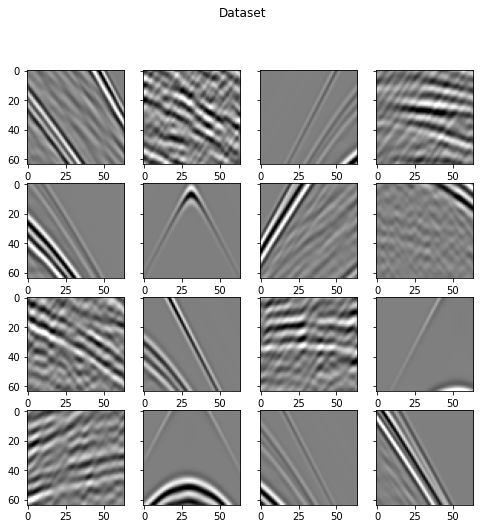

In [11]:
# Create patches
xs = patching(p, s, r, dt, npatch=(nspatch, ntpatch), njump=(nsjump, ntjump), window=True, 
              vel_sep=vel_sep, toff=toff, nsmoothwin=nsmoothwin, thresh=1e-4, augumentdirect=True)

# Visualize
cmax = 0.8
nviz = 4
np.random.seed(5)
ivizs = np.random.permutation(np.arange(len(xs)))[:nviz**2]
fig, axs = plt.subplots(nviz, nviz, sharey=True, figsize=(8, 8))
axs = axs.ravel()
fig.suptitle('Dataset', y=0.99)
for i, iviz in enumerate(ivizs):
    axs[i].imshow(xs[iviz].T, cmap='gray', vmin=-cmax, vmax=cmax)
    axs[i].axis('tight')

## Training

Working with Experiment 3 - ResNet network with more filters 300enc - - mse+ccc cost with learned weigths + mask
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 32, 32]              32
       BatchNorm2d-2           [-1, 32, 32, 32]              64
            Conv2d-3           [-1, 32, 32, 32]             800
       BatchNorm2d-4           [-1, 32, 32, 32]              64
         LeakyReLU-5           [-1, 32, 32, 32]               0
            Conv2d-6           [-1, 32, 32, 32]          25,600
       BatchNorm2d-7           [-1, 32, 32, 32]              64
         LeakyReLU-8           [-1, 32, 32, 32]               0
       ResNetBlock-9           [-1, 32, 32, 32]               0
           Conv2d-10           [-1, 32, 32, 32]           1,024
      BatchNorm2d-11           [-1, 32, 32, 32]              64
           Conv2d-12           [-1, 32, 32, 32]       

  0%|          | 0/105 [00:00<?, ?it/s]

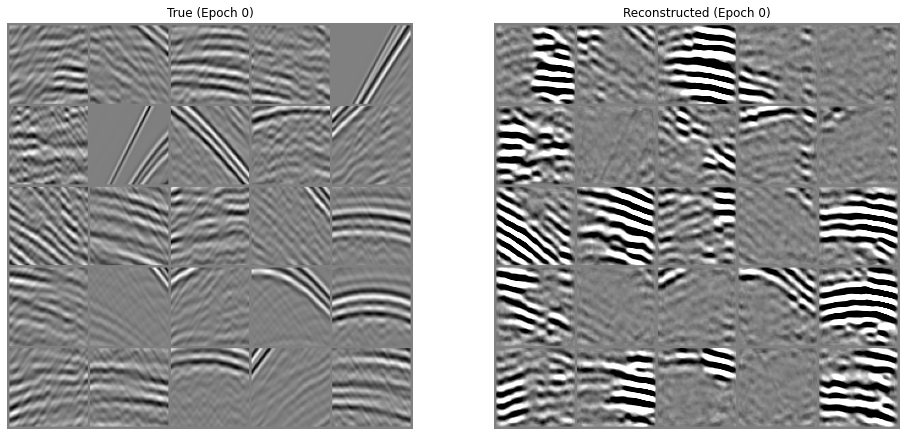

epoch [0/40]   -- Train: 0.81618881, Valid: 1.47990084 -- lr=0.00004000
mse (w=-0.004/0.502)  -- Train: 0.83586282/0.41942814, Valid: 2.23201752/1.12000549 --
ccc (w=-0.005/0.502)  -- Train: 0.79749161/0.40069780, Valid: 0.72470123/0.36412445 --


  0%|          | 0/105 [00:00<?, ?it/s]

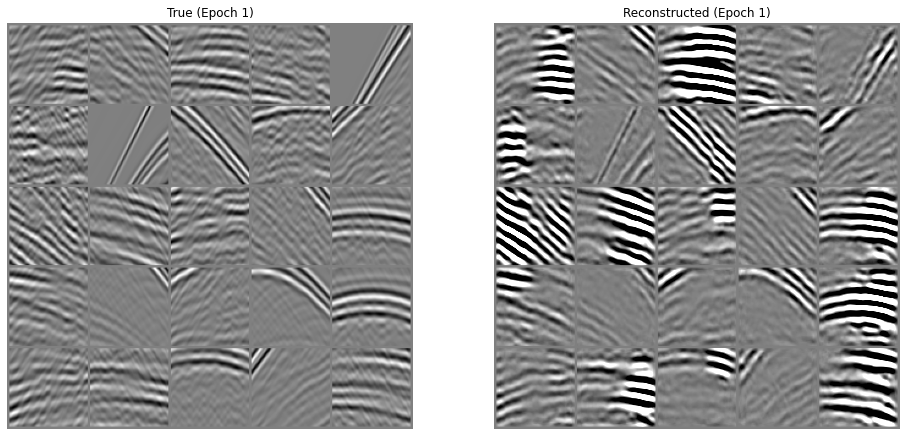

epoch [1/40]   -- Train: 0.63770169, Valid: 1.23616171 -- lr=0.00005944
mse (w=-0.010/0.505)  -- Train: 0.74759984/0.37750396, Valid: 1.92817616/0.97364140 --
ccc (w=-0.011/0.506)  -- Train: 0.53336328/0.26972577, Valid: 0.54008609/0.27312556 --


  0%|          | 0/105 [00:00<?, ?it/s]

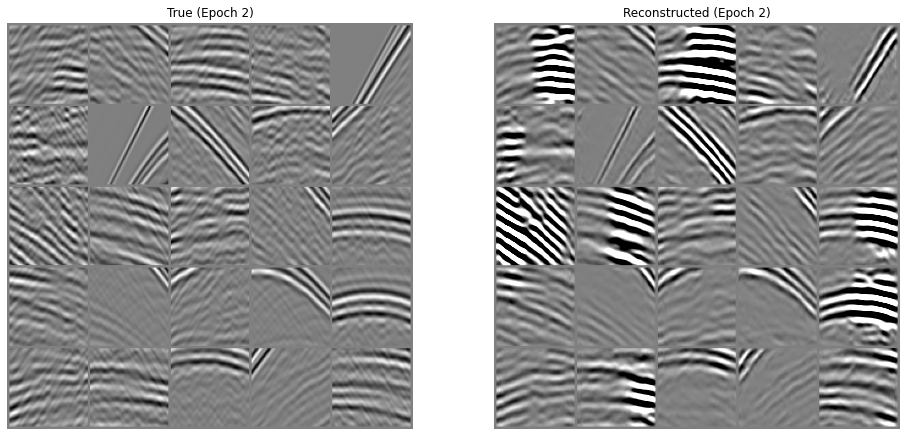

epoch [2/40]   -- Train: 0.54802912, Valid: 0.88372618 -- lr=0.00011620
mse (w=-0.022/0.511)  -- Train: 0.72651261/0.37137464, Valid: 1.36895430/0.69977438 --
ccc (w=-0.024/0.512)  -- Train: 0.38465619/0.19694667, Valid: 0.40403408/0.20686828 --


  0%|          | 0/105 [00:00<?, ?it/s]

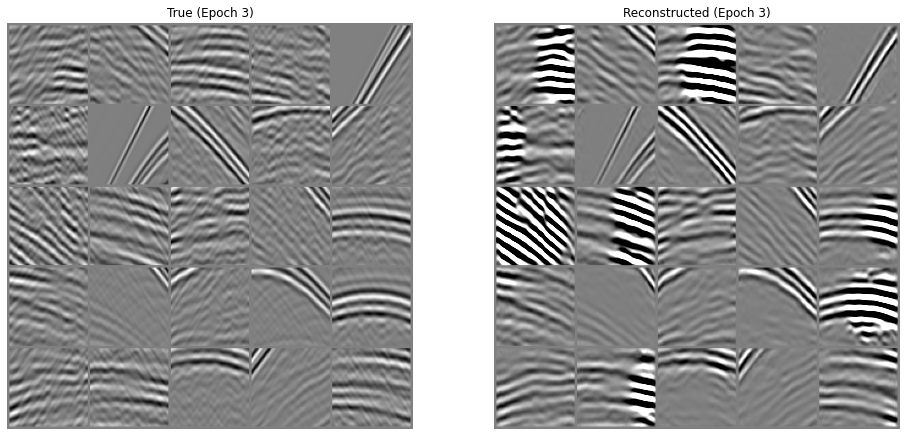

epoch [3/40]   -- Train: 0.48993161, Valid: 0.51869929 -- lr=0.00020567
mse (w=-0.044/0.522)  -- Train: 0.69908035/0.36519501, Valid: 0.78310251/0.40908763 --
ccc (w=-0.045/0.523)  -- Train: 0.31394151/0.16426912, Valid: 0.29477710/0.15424138 --


  0%|          | 0/105 [00:00<?, ?it/s]

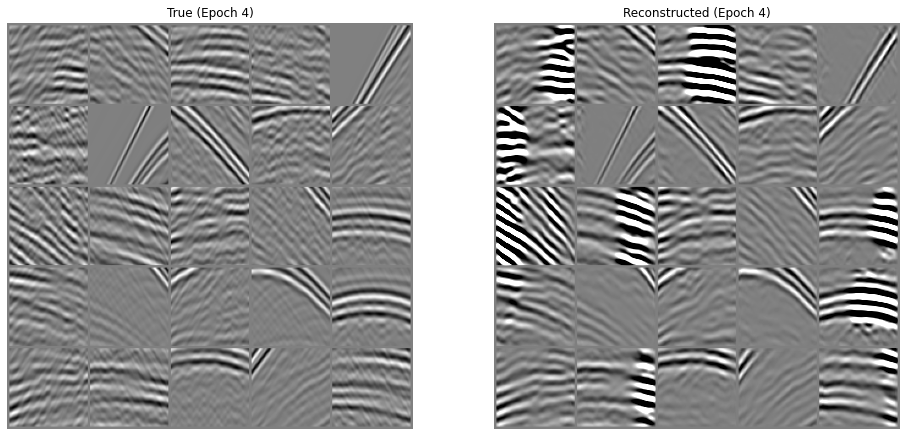

epoch [4/40]   -- Train: 0.43606365, Valid: 0.76215327 -- lr=0.00032060
mse (w=-0.078/0.540)  -- Train: 0.65523183/0.35410514, Valid: 1.24987745/0.67546785 --
ccc (w=-0.079/0.541)  -- Train: 0.28097683/0.15206107, Valid: 0.30514401/0.16514005 --


  0%|          | 0/105 [00:00<?, ?it/s]

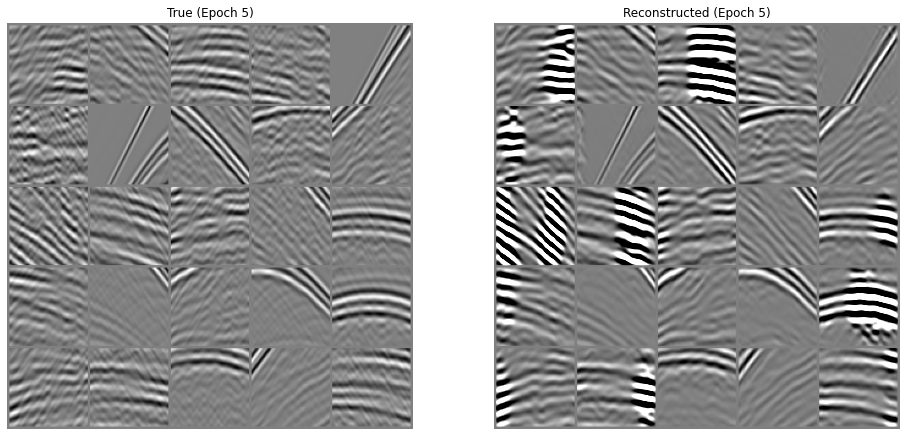

epoch [5/40]   -- Train: 0.36545330, Valid: 0.25890720 -- lr=0.00045169
mse (w=-0.126/0.567)  -- Train: 0.58949274/0.33421648, Valid: 0.46416709/0.26316234 --
ccc (w=-0.127/0.567)  -- Train: 0.25541827/0.14494880, Valid: 0.21479338/0.12189434 --


  0%|          | 0/105 [00:00<?, ?it/s]

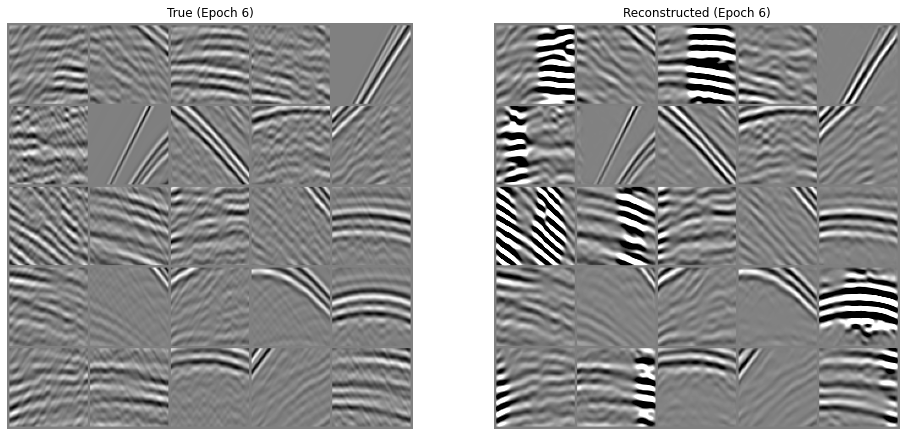

epoch [6/40]   -- Train: 0.27830061, Valid: 0.17128295 -- lr=0.00058831
mse (w=-0.188/0.604)  -- Train: 0.50788206/0.30652237, Valid: 0.37703770/0.22755378 --
ccc (w=-0.188/0.604)  -- Train: 0.23680104/0.14294772, Valid: 0.21870926/0.13202640 --


  0%|          | 0/105 [00:00<?, ?it/s]

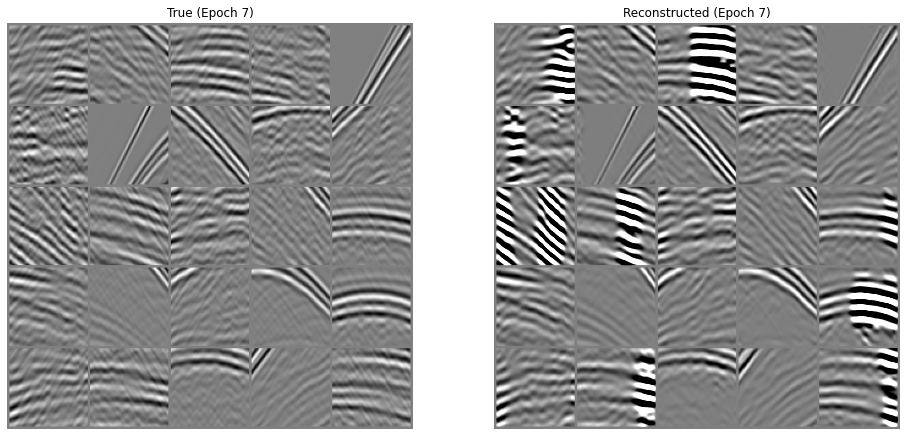

epoch [7/40]   -- Train: 0.16817707, Valid: 0.01552555 -- lr=0.00071940
mse (w=-0.265/0.652)  -- Train: 0.41281587/0.26895902, Valid: 0.23439816/0.15271577 --
ccc (w=-0.264/0.651)  -- Train: 0.21667540/0.14105992, Valid: 0.19527496/0.12712783 --


  0%|          | 0/105 [00:00<?, ?it/s]

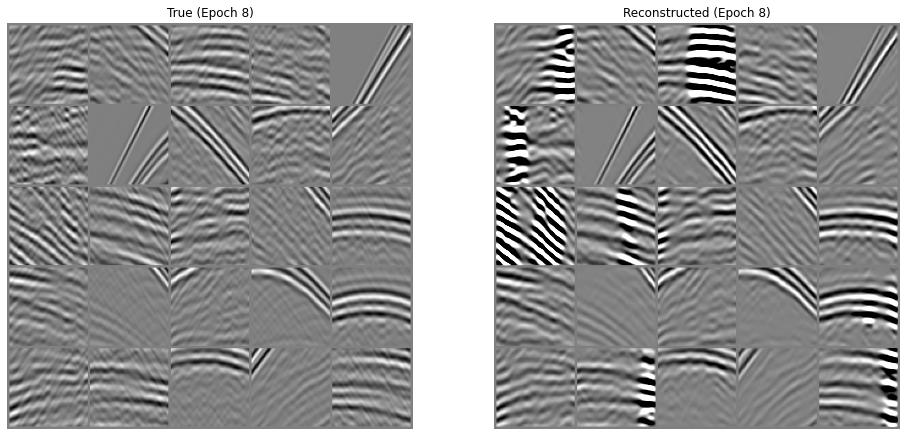

epoch [8/40]   -- Train: 0.03914715, Valid: -0.07764891 -- lr=0.00083433
mse (w=-0.353/0.712)  -- Train: 0.31425104/0.22373037, Valid: 0.22202727/0.15807186 --
ccc (w=-0.352/0.711)  -- Train: 0.19669442/0.13977550, Valid: 0.16428448/0.11674426 --


  0%|          | 0/105 [00:00<?, ?it/s]

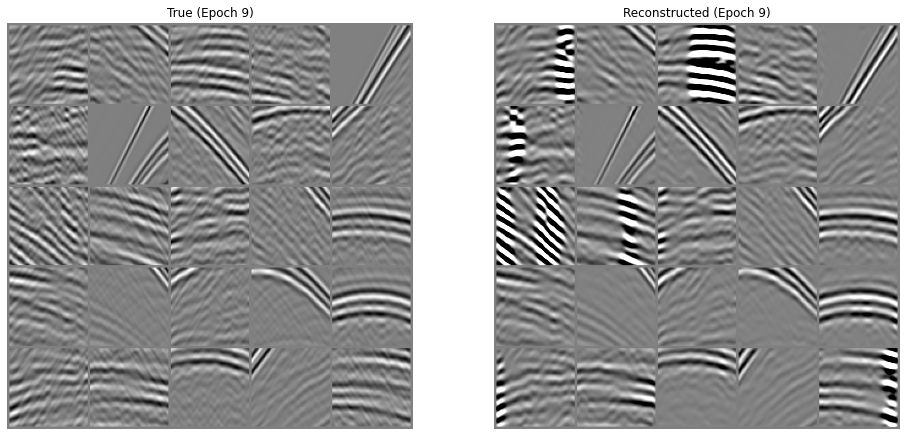

epoch [9/40]   -- Train: -0.10784676, Valid: -0.20097089 -- lr=0.00092380
mse (w=-0.452/0.785)  -- Train: 0.21695416/0.17039657, Valid: 0.15971701/0.12544231 --
ccc (w=-0.449/0.783)  -- Train: 0.17624255/0.13799959, Valid: 0.15791629/0.12364996 --


  0%|          | 0/105 [00:00<?, ?it/s]

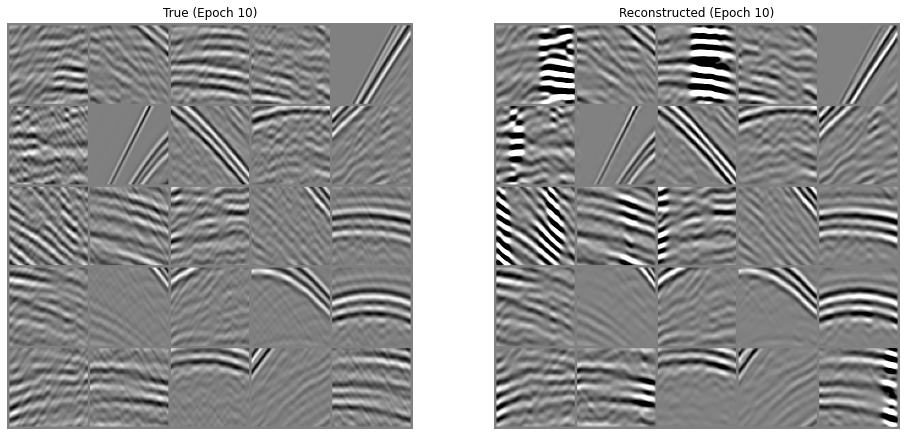

epoch [10/40]   -- Train: -0.26583269, Valid: -0.35292137 -- lr=0.00098056
mse (w=-0.556/0.872)  -- Train: 0.13001874/0.11331607, Valid: 0.08470849/0.07382654 --
ccc (w=-0.551/0.868)  -- Train: 0.15607178/0.13545690, Valid: 0.14611956/0.12681924 --


  0%|          | 0/105 [00:00<?, ?it/s]

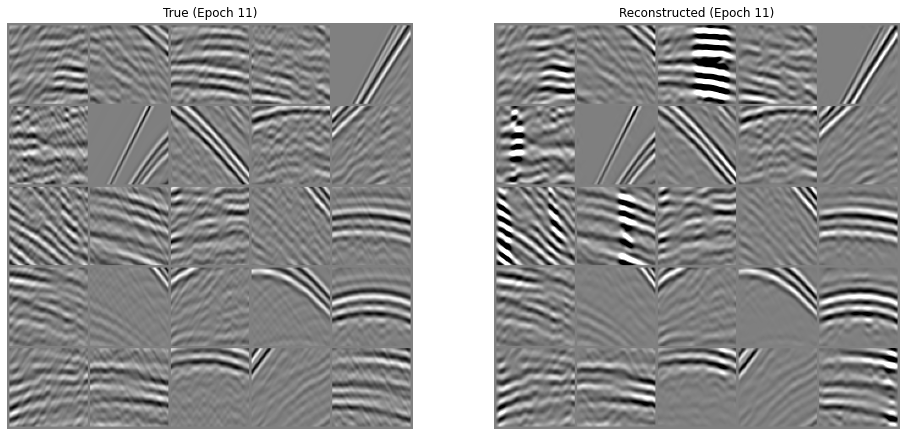

epoch [11/40]   -- Train: -0.42617109, Valid: -0.51411521 -- lr=0.00100000
mse (w=-0.662/0.969)  -- Train: 0.05962644/0.05777264, Valid: 0.02662187/0.02579419 --
ccc (w=-0.657/0.964)  -- Train: 0.13722922/0.13229693, Valid: 0.12358591/0.11914399 --


  0%|          | 0/105 [00:00<?, ?it/s]

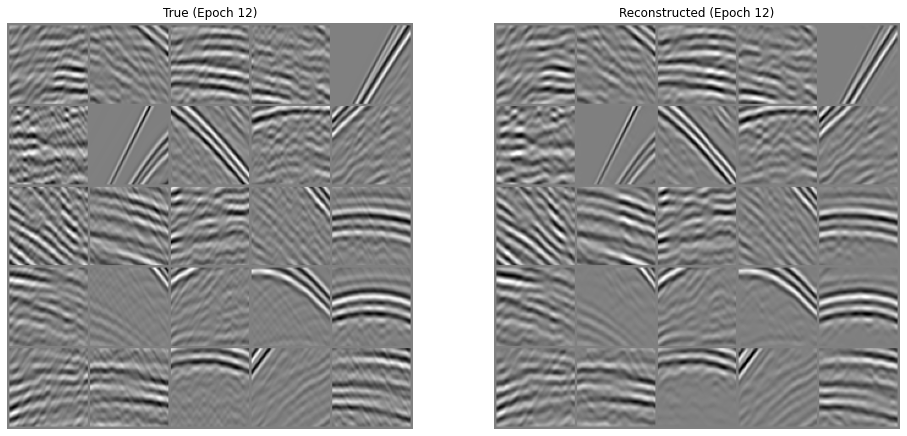

epoch [12/40]   -- Train: -0.58268994, Valid: -0.65878636 -- lr=0.00099686
mse (w=-0.767/1.076)  -- Train: 0.01372739/0.01477513, Valid: 0.00537638/0.00578673 --
ccc (w=-0.761/1.071)  -- Train: 0.11306150/0.12105248, Valid: 0.09292822/0.09949622 --


  0%|          | 0/105 [00:00<?, ?it/s]

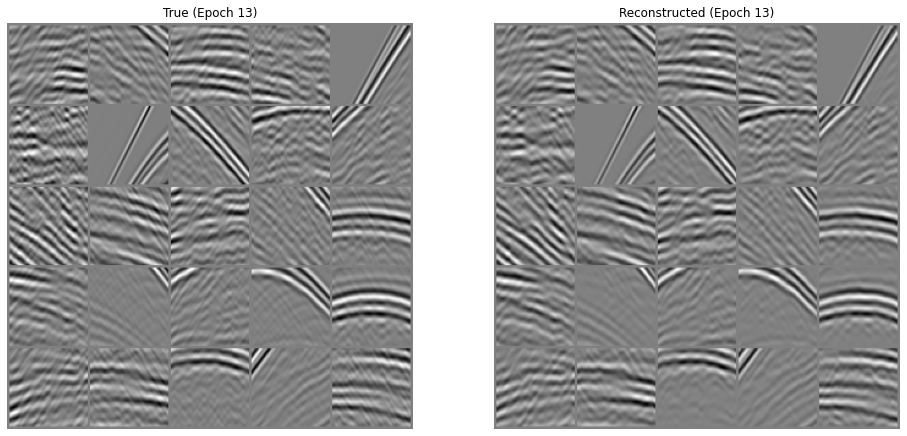

epoch [13/40]   -- Train: -0.70049053, Valid: -0.76051480 -- lr=0.00098746
mse (w=-0.870/1.194)  -- Train: 0.00485809/0.00580021, Valid: 0.00437573/0.00522432 --
ccc (w=-0.865/1.188)  -- Train: 0.09710648/0.11531840, Valid: 0.08587245/0.10197747 --


  0%|          | 0/105 [00:00<?, ?it/s]

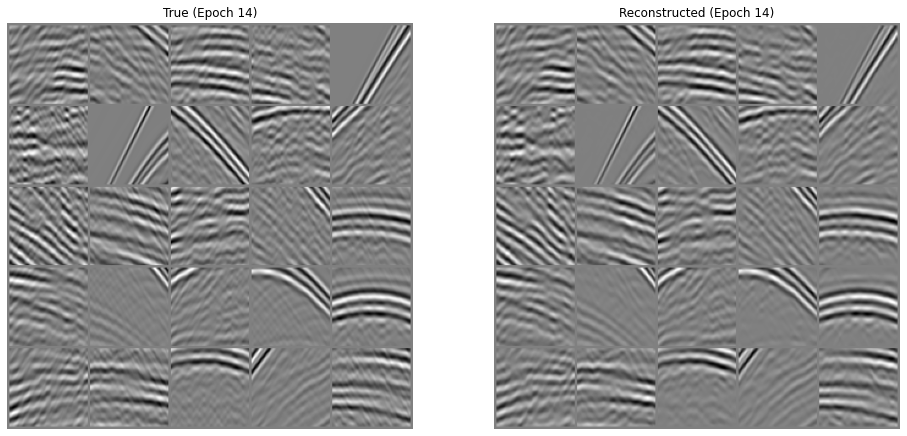

epoch [14/40]   -- Train: -0.79945946, Valid: -0.85190105 -- lr=0.00097194
mse (w=-0.972/1.322)  -- Train: 0.00425613/0.00562750, Valid: 0.00427190/0.00564835 --
ccc (w=-0.967/1.315)  -- Train: 0.09078640/0.11937703, Valid: 0.08528160/0.11213865 --


  0%|          | 0/105 [00:00<?, ?it/s]

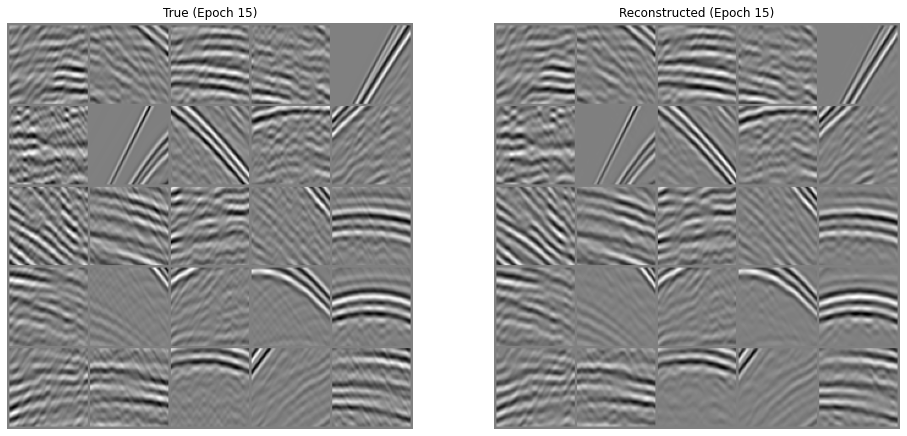

epoch [15/40]   -- Train: -0.89311057, Valid: -0.93945456 -- lr=0.00095048
mse (w=-1.072/1.461)  -- Train: 0.00391006/0.00571250, Valid: 0.00465252/0.00679723 --
ccc (w=-1.067/1.453)  -- Train: 0.08725085/0.12675084, Valid: 0.08478317/0.12316599 --


  0%|          | 0/105 [00:00<?, ?it/s]

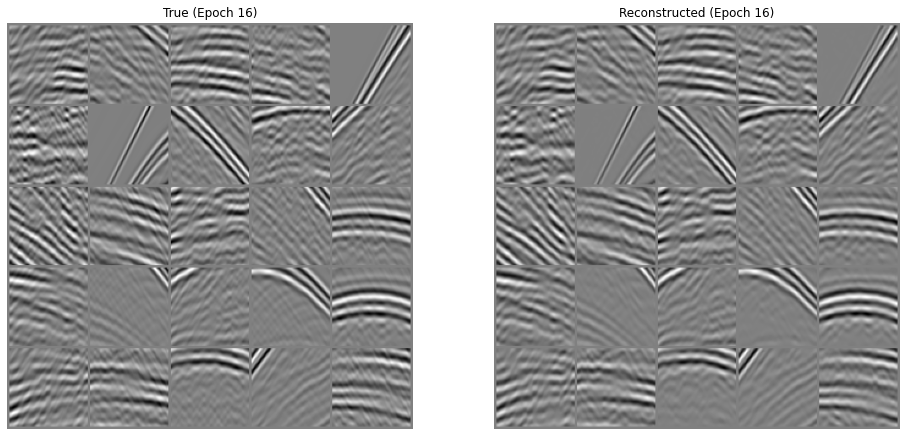

epoch [16/40]   -- Train: -0.98536748, Valid: -1.04105413 -- lr=0.00092336
mse (w=-1.169/1.610)  -- Train: 0.00354545/0.00570718, Valid: 0.00340757/0.00548523 --
ccc (w=-1.163/1.600)  -- Train: 0.08304901/0.13290788, Valid: 0.07482706/0.11974984 --


  0%|          | 0/105 [00:00<?, ?it/s]

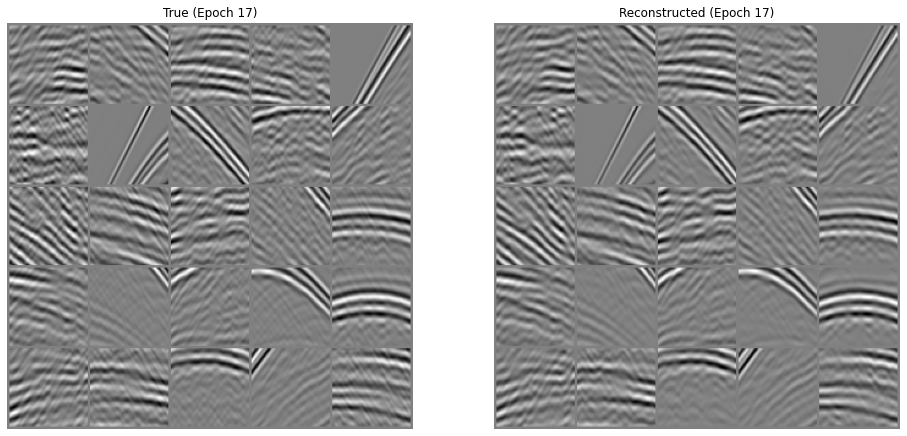

epoch [17/40]   -- Train: -1.07335806, Valid: -1.12161565 -- lr=0.00089092
mse (w=-1.263/1.768)  -- Train: 0.00322076/0.00569291, Valid: 0.00354008/0.00625733 --
ccc (w=-1.257/1.757)  -- Train: 0.07980499/0.14020784, Valid: 0.07504575/0.13184643 --


  0%|          | 0/105 [00:00<?, ?it/s]

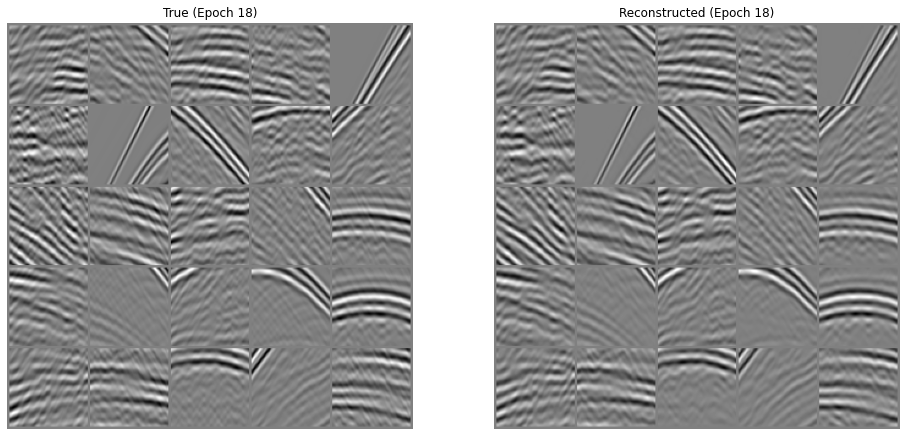

epoch [18/40]   -- Train: -1.15709460, Valid: -1.20184553 -- lr=0.00085355
mse (w=-1.352/1.933)  -- Train: 0.00299589/0.00579192, Valid: 0.00330134/0.00638246 --
ccc (w=-1.346/1.921)  -- Train: 0.07697518/0.14787626, Valid: 0.07338413/0.14097753 --


  0%|          | 0/105 [00:00<?, ?it/s]

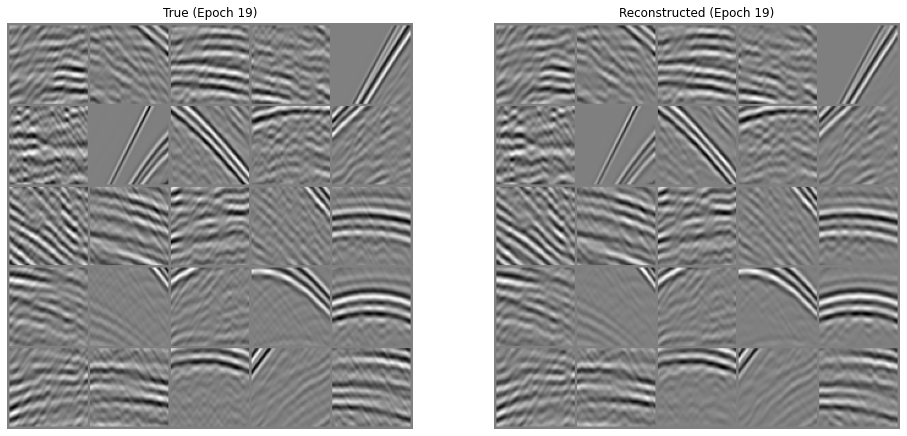

epoch [19/40]   -- Train: -1.23793721, Valid: -1.27274609 -- lr=0.00081175
mse (w=-1.438/2.105)  -- Train: 0.00270364/0.00569199, Valid: 0.00347756/0.00732132 --
ccc (w=-1.431/2.092)  -- Train: 0.07385168/0.15447161, Valid: 0.07376266/0.15428542 --


  0%|          | 0/105 [00:00<?, ?it/s]

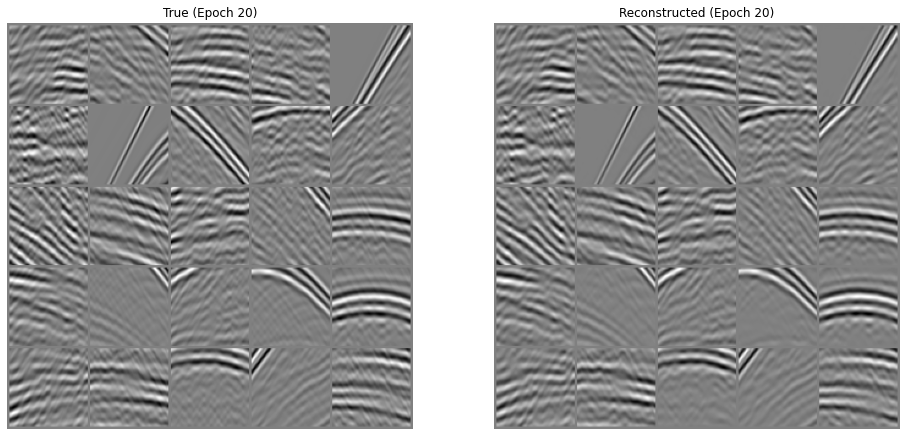

epoch [20/40]   -- Train: -1.31402206, Valid: -1.35043812 -- lr=0.00076602
mse (w=-1.518/2.282)  -- Train: 0.00244432/0.00557707, Valid: 0.00304661/0.00695127 --
ccc (w=-1.511/2.267)  -- Train: 0.07112110/0.16119826, Valid: 0.06941481/0.15733090 --


  0%|          | 0/105 [00:00<?, ?it/s]

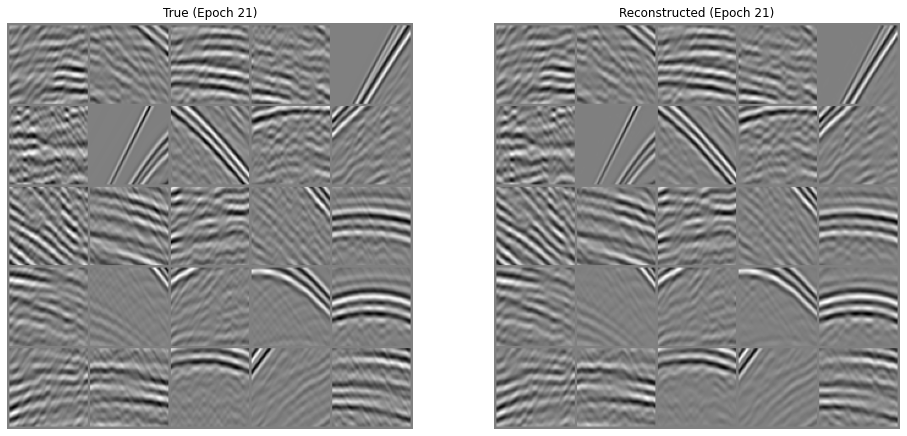

epoch [21/40]   -- Train: -1.38396037, Valid: -1.42275095 -- lr=0.00071694
mse (w=-1.593/2.460)  -- Train: 0.00225714/0.00555264, Valid: 0.00255217/0.00627844 --
ccc (w=-1.586/2.443)  -- Train: 0.06914779/0.16894449, Valid: 0.06584203/0.16086774 --


  0%|          | 0/105 [00:00<?, ?it/s]

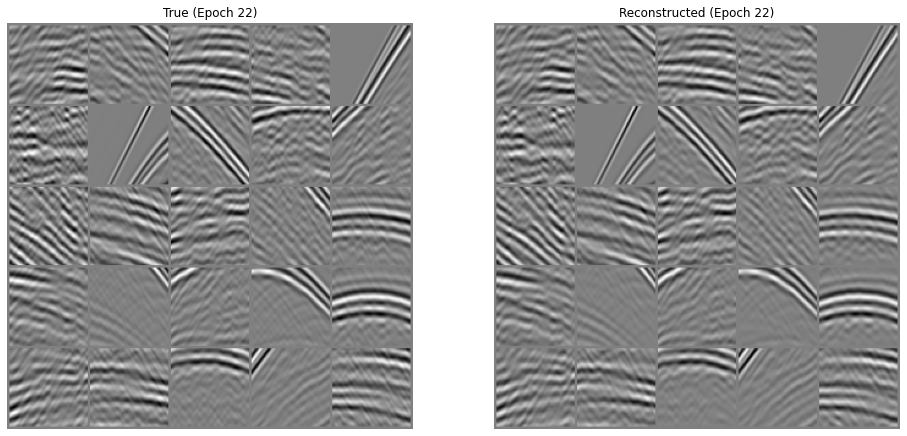

epoch [22/40]   -- Train: -1.45262158, Valid: -1.48762560 -- lr=0.00066514
mse (w=-1.663/2.638)  -- Train: 0.00203682/0.00537310, Valid: 0.00253005/0.00667422 --
ccc (w=-1.656/2.619)  -- Train: 0.06589006/0.17259838, Valid: 0.06312089/0.16534455 --


  0%|          | 0/105 [00:00<?, ?it/s]

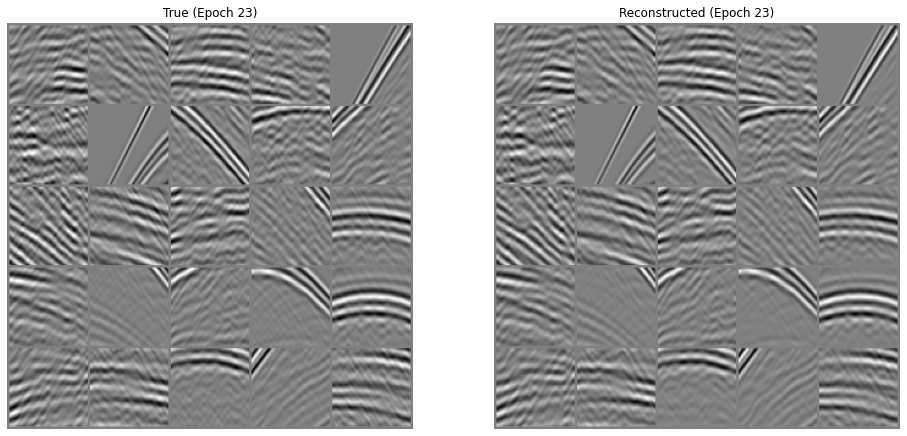

epoch [23/40]   -- Train: -1.51292050, Valid: -1.55108356 -- lr=0.00061126
mse (w=-1.727/2.813)  -- Train: 0.00187639/0.00527802, Valid: 0.00210405/0.00591840 --
ccc (w=-1.720/2.793)  -- Train: 0.06411768/0.17905371, Valid: 0.05970399/0.16672814 --


  0%|          | 0/105 [00:00<?, ?it/s]

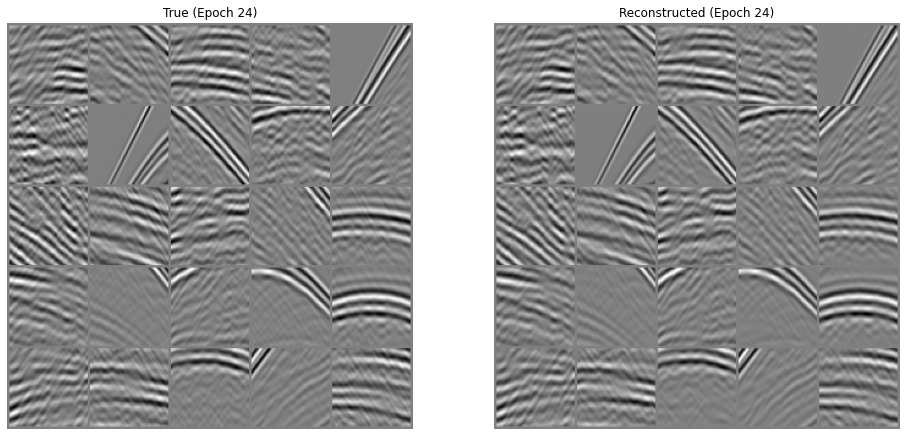

epoch [24/40]   -- Train: -1.56885552, Valid: -1.58845782 -- lr=0.00055598
mse (w=-1.786/2.982)  -- Train: 0.00169586/0.00505697, Valid: 0.00218090/0.00650336 --
ccc (w=-1.778/2.960)  -- Train: 0.06220753/0.18411906, Valid: 0.06319056/0.18702859 --


  0%|          | 0/105 [00:00<?, ?it/s]

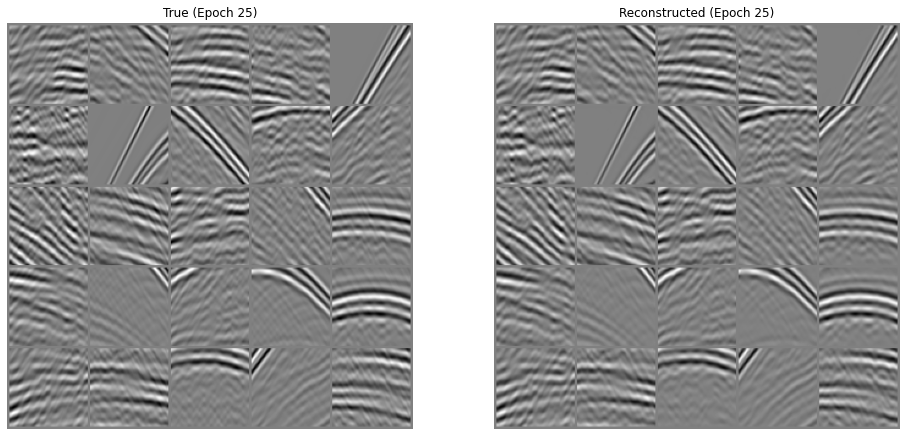

epoch [25/40]   -- Train: -1.62096894, Valid: -1.64620054 -- lr=0.00050000
mse (w=-1.838/3.143)  -- Train: 0.00154653/0.00486026, Valid: 0.00192506/0.00604988 --
ccc (w=-1.831/3.119)  -- Train: 0.06000752/0.18715771, Valid: 0.05841077/0.18217759 --


  0%|          | 0/105 [00:00<?, ?it/s]

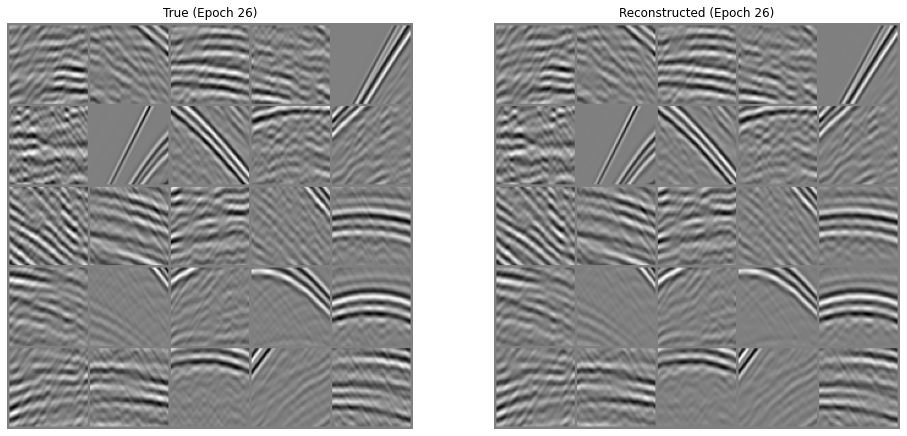

epoch [26/40]   -- Train: -1.66628611, Valid: -1.69034517 -- lr=0.00044402
mse (w=-1.885/3.293)  -- Train: 0.00139185/0.00458292, Valid: 0.00188402/0.00620350 --
ccc (w=-1.877/3.267)  -- Train: 0.05850238/0.19114102, Valid: 0.05644612/0.18442275 --


  0%|          | 0/105 [00:00<?, ?it/s]

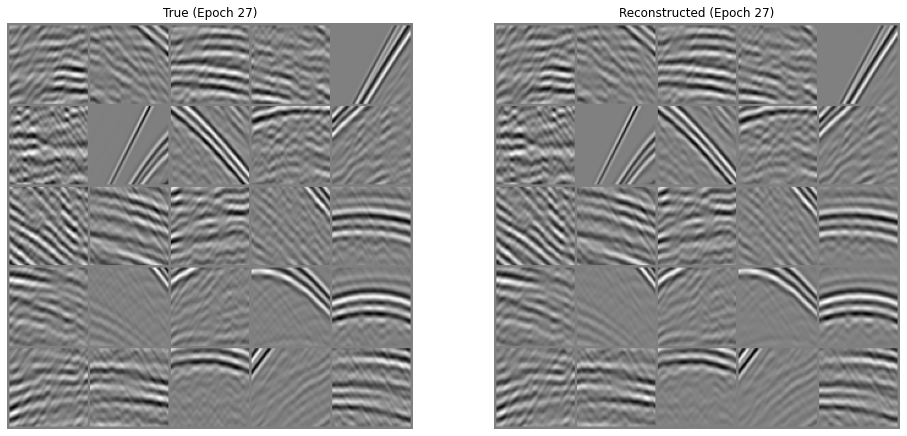

epoch [27/40]   -- Train: -1.70680106, Valid: -1.72966564 -- lr=0.00038874
mse (w=-1.926/3.430)  -- Train: 0.00132331/0.00453879, Valid: 0.00184213/0.00631826 --
ccc (w=-1.918/3.403)  -- Train: 0.05697191/0.19386342, Valid: 0.05457938/0.18572216 --


  0%|          | 0/105 [00:00<?, ?it/s]

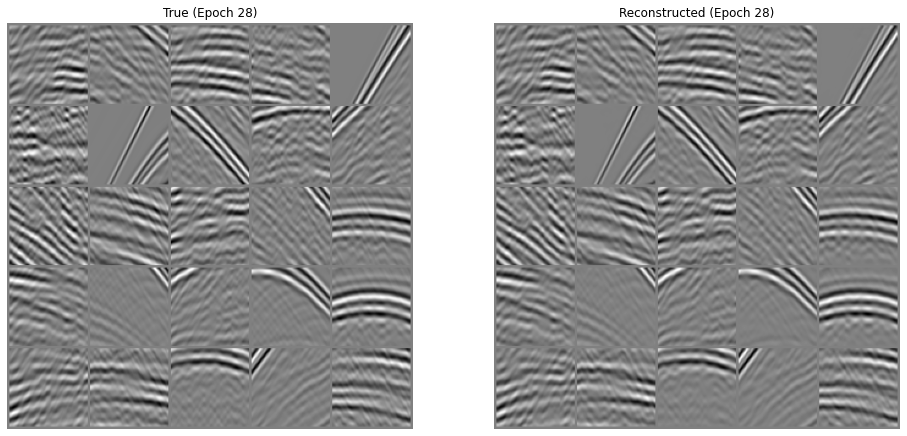

epoch [28/40]   -- Train: -1.74569952, Valid: -1.75799108 -- lr=0.00033486
mse (w=-1.961/3.553)  -- Train: 0.00115618/0.00410746, Valid: 0.00159353/0.00566121 --
ccc (w=-1.953/3.524)  -- Train: 0.05469615/0.19276513, Valid: 0.05481301/0.19317700 --


  0%|          | 0/105 [00:00<?, ?it/s]

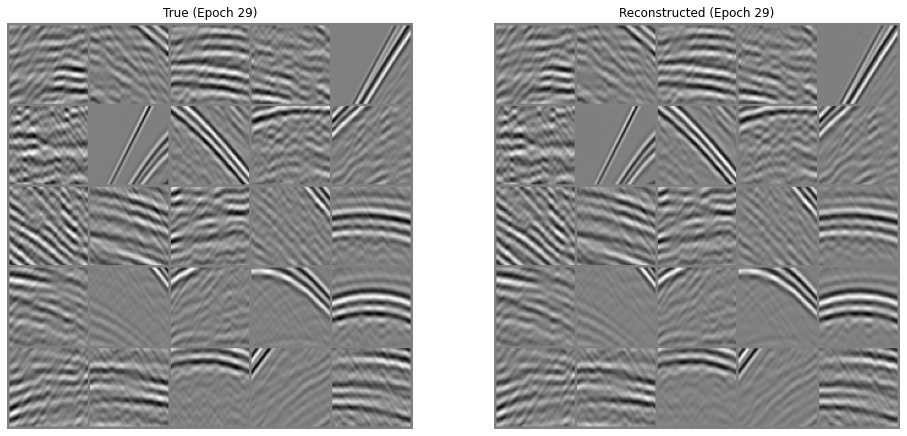

epoch [29/40]   -- Train: -1.77549434, Valid: -1.79410970 -- lr=0.00028306
mse (w=-1.991/3.660)  -- Train: 0.00106149/0.00388483, Valid: 0.00155108/0.00567662 --
ccc (w=-1.982/3.630)  -- Train: 0.05374620/0.19511186, Valid: 0.05143295/0.18671419 --


  0%|          | 0/105 [00:00<?, ?it/s]

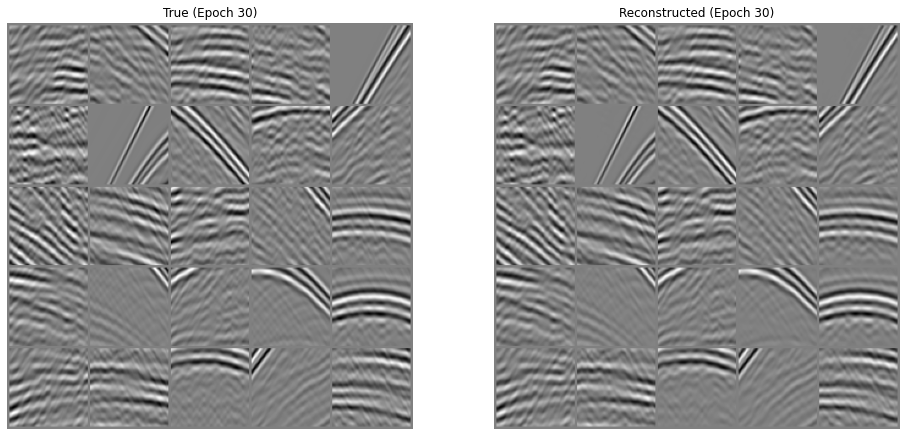

epoch [30/40]   -- Train: -1.80371523, Valid: -1.81600118 -- lr=0.00023399
mse (w=-2.015/3.751)  -- Train: 0.00097620/0.00366155, Valid: 0.00143863/0.00539606 --
ccc (w=-2.007/3.720)  -- Train: 0.05206833/0.19371295, Valid: 0.05097596/0.18964896 --


  0%|          | 0/105 [00:00<?, ?it/s]

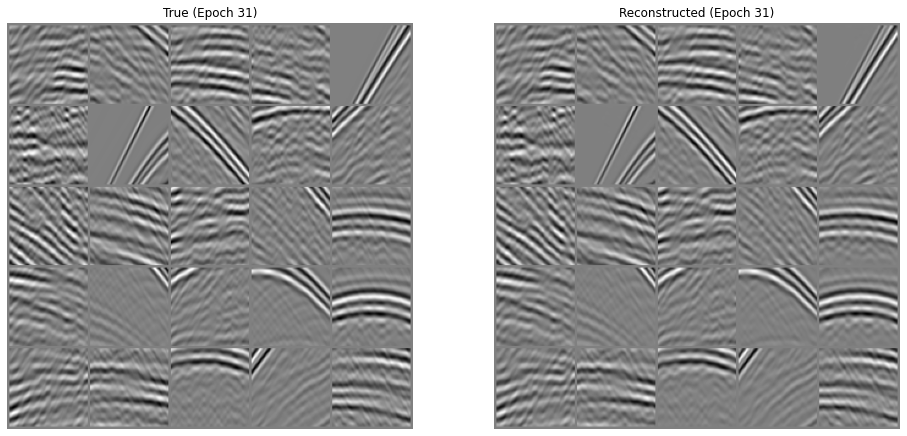

epoch [31/40]   -- Train: -1.82395709, Valid: -1.84012771 -- lr=0.00018826
mse (w=-2.035/3.826)  -- Train: 0.00093761/0.00358704, Valid: 0.00137703/0.00526812 --
ccc (w=-2.027/3.794)  -- Train: 0.05145732/0.19524519, Valid: 0.04885625/0.18537594 --


  0%|          | 0/105 [00:00<?, ?it/s]

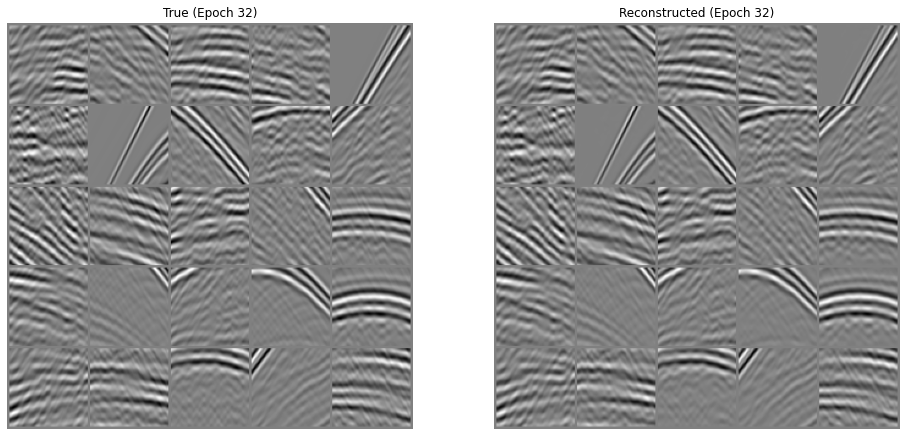

epoch [32/40]   -- Train: -1.84618461, Valid: -1.85740256 -- lr=0.00014645
mse (w=-2.050/3.885)  -- Train: 0.00083566/0.00324654, Valid: 0.00129604/0.00503510 --
ccc (w=-2.042/3.853)  -- Train: 0.04942876/0.19044736, Valid: 0.04767532/0.18369141 --


  0%|          | 0/105 [00:00<?, ?it/s]

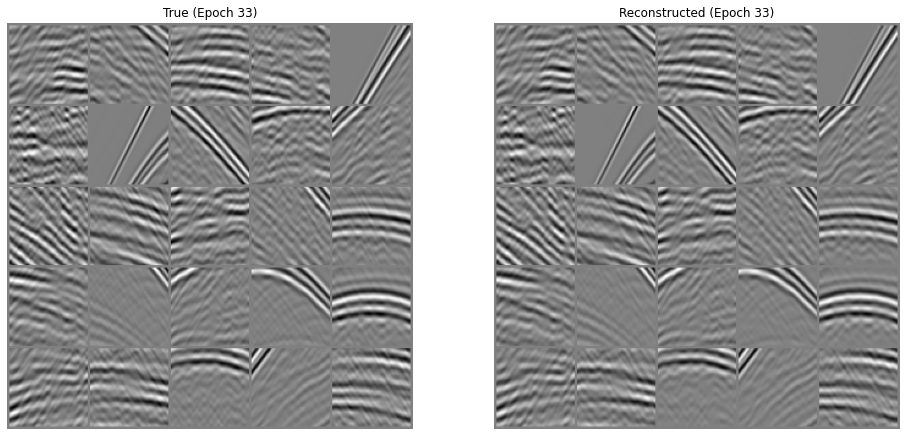

epoch [33/40]   -- Train: -1.86311674, Valid: -1.87353015 -- lr=0.00010909
mse (w=-2.062/3.930)  -- Train: 0.00078272/0.00307591, Valid: 0.00125828/0.00494473 --
ccc (w=-2.053/3.897)  -- Train: 0.04790428/0.18669489, Valid: 0.04595502/0.17909813 --


  0%|          | 0/105 [00:00<?, ?it/s]

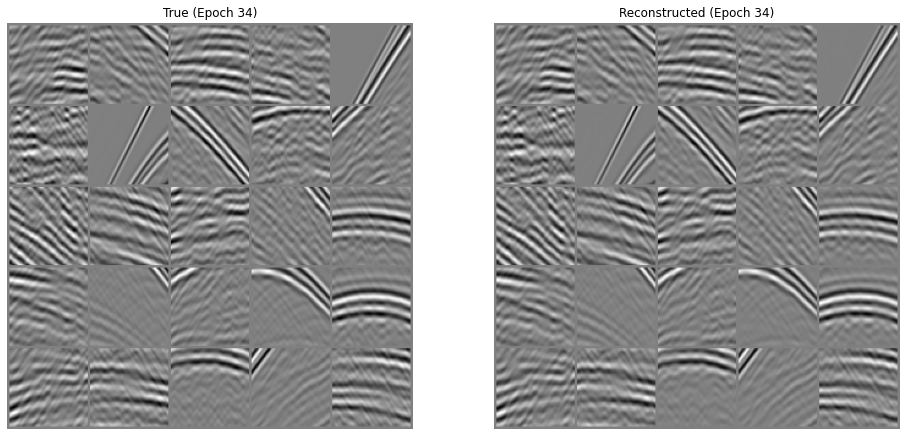

epoch [34/40]   -- Train: -1.87558830, Valid: -1.88665330 -- lr=0.00007664
mse (w=-2.070/3.962)  -- Train: 0.00074437/0.00294882, Valid: 0.00124652/0.00493813 --
ccc (w=-2.061/3.929)  -- Train: 0.04677725/0.18376903, Valid: 0.04429333/0.17401069 --


  0%|          | 0/105 [00:00<?, ?it/s]

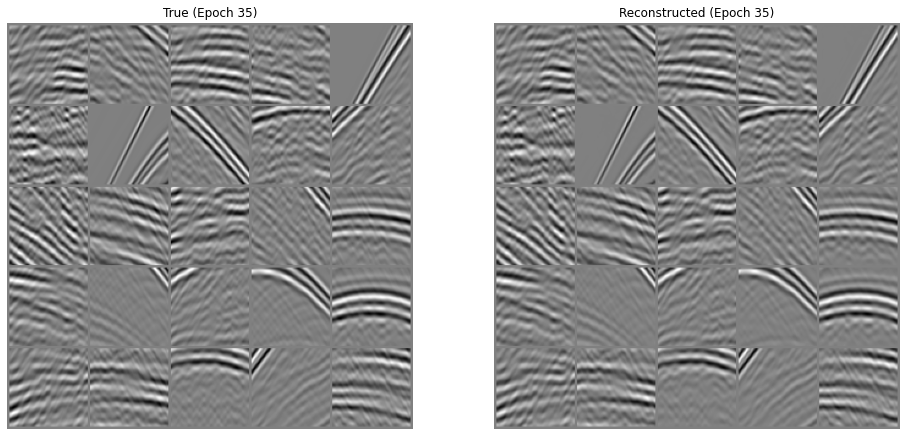

epoch [35/40]   -- Train: -1.88530564, Valid: -1.87791157 -- lr=0.00004952
mse (w=-2.075/3.982)  -- Train: 0.00071810/0.00285963, Valid: 0.00120476/0.00479760 --
ccc (w=-2.067/3.949)  -- Train: 0.04570534/0.18049206, Valid: 0.04762959/0.18809099 --


  0%|          | 0/105 [00:00<?, ?it/s]

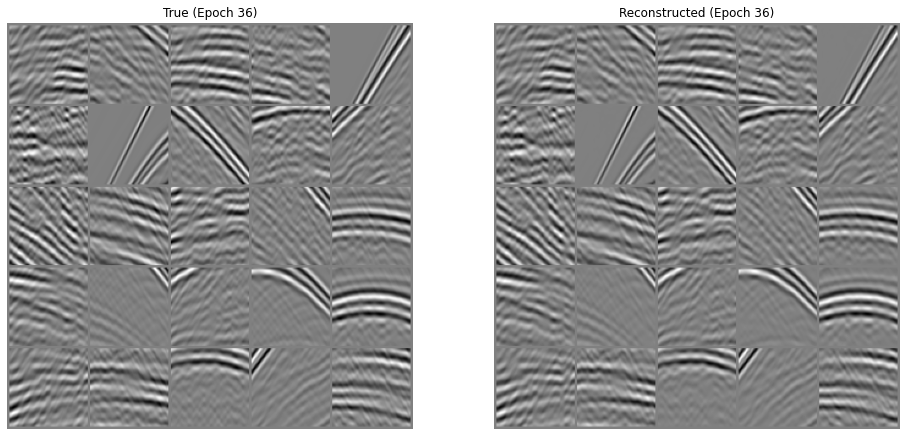

epoch [36/40]   -- Train: -1.89619064, Valid: -1.89998507 -- lr=0.00002806
mse (w=-2.078/3.994)  -- Train: 0.00070596/0.00281958, Valid: 0.00120080/0.00479599 --
ccc (w=-2.070/3.961)  -- Train: 0.04380890/0.17351273, Valid: 0.04266126/0.16896734 --


  0%|          | 0/105 [00:00<?, ?it/s]

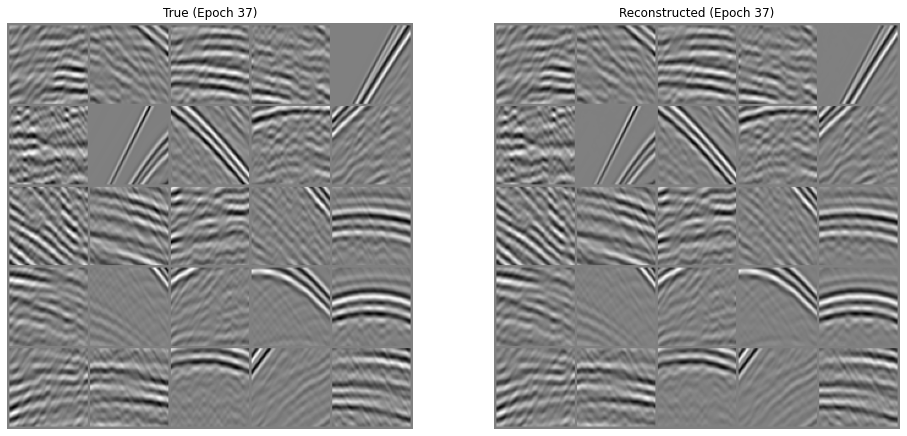

epoch [37/40]   -- Train: -1.90344226, Valid: -1.90162945 -- lr=0.00001254
mse (w=-2.079/3.999)  -- Train: 0.00070747/0.00282936, Valid: 0.00119202/0.00476723 --
ccc (w=-2.071/3.966)  -- Train: 0.04242313/0.16824554, Valid: 0.04253096/0.16867316 --


  0%|          | 0/105 [00:00<?, ?it/s]

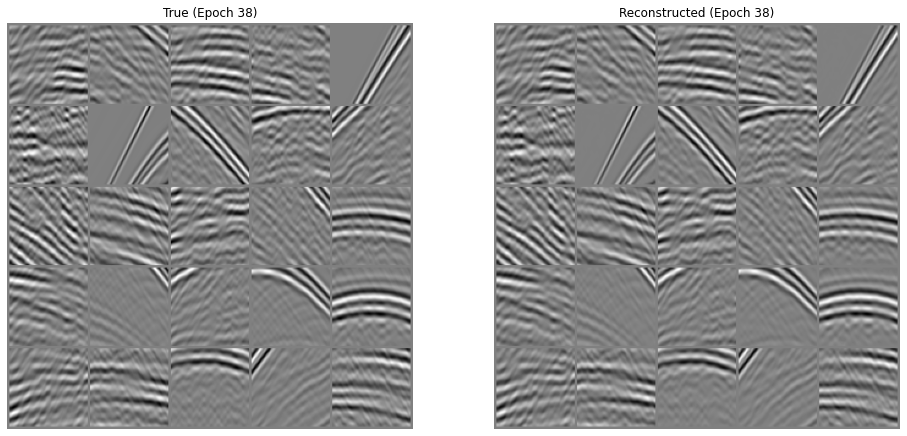

epoch [38/40]   -- Train: -1.91092634, Valid: -1.90384746 -- lr=0.00000315
mse (w=-2.080/4.001)  -- Train: 0.00067729/0.00270955, Valid: 0.00119289/0.00477226 --
ccc (w=-2.071/3.967)  -- Train: 0.04074004/0.16162404, Valid: 0.04203923/0.16677821 --


  0%|          | 0/105 [00:00<?, ?it/s]

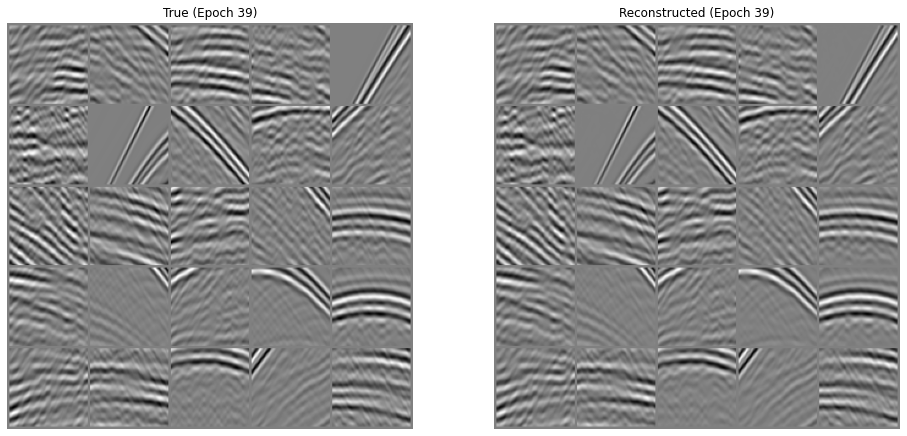

epoch [39/40]   -- Train: -1.91253924, Valid: -1.90566850 -- lr=0.00000000
mse (w=-2.080/4.001)  -- Train: 0.00068326/0.00273343, Valid: 0.00119189/0.00476826 --
ccc (w=-2.071/3.967)  -- Train: 0.04036226/0.16012533, Valid: 0.04158124/0.16496125 --


In [12]:
print('Working with Experiment %d - %s' % (iexp, expname))

# Create directory to save training evolution
figdir = os.path.join(outputfigs, 'exp%d' % iexp)

if figdir is not None:
    if not os.path.exists(figdir):
        os.mkdir(figdir)

# Create model to train
autoencoder = aetype(nh=ntpatch, nw=nspatch, nenc=nenc, 
                     kernel_size=kernel_size, nfilts=nfilts, 
                     nlayers=nlayers, nlevels=nlevels,
                     restriction=RDupop_torch, 
                     convbias=convbias, act_fun=act_fun, 
                     downstride=downstride, downmode=downmode,
                     upmode=upmode, bnormlast=bnormlast,  
                     relu_enc=relu_enc, tanh_enc=tanh_enc, 
                     relu_dec=relu_dec, tanh_final=tanh_final,
                     patcher=Pop1_torch, npatches=npatches[0]*npatches[1],
                     patchesscaling=scalings)

mod = Train(device, # device
            ntpatch, nspatch, nenc, # sizes
            autoencoder, # model
            loss, weight_decay, learning_rate, betas=betas, # optimizer
            num_epochs=num_epochs, batch_size=batch_size, 
            noise_std=noise_std, mask_perc=mask_perc, lossweights=lossweights,  # training
            adapt_learning=adapt_learning, lr_scheduler=lr_scheduler, lr_factor=lr_factor, 
            lr_thresh=lr_thresh, lr_patience=lr_patience, lr_max=lr_max, # adaptive learning rate
            early_stop=early_stop, es_patience=es_patience, # early stopping
            plotflag=plotflag, figdir=figdir)
mod.model.to(device)
summary(mod.model, input_size=(1, nspatch, ntpatch))

# Create training data
x_train, x_valid = mod.load_data(xs, 0.1)

# Train
if loadmodel:
    print('Loading model...')
    mod.model.load_state_dict(torch.load(os.path.join(outputmodels, 'exp%d_modelweights.pt' % iexp))) 
else:
    print('Training model...')
    mod.init_weights(seed=5)
    mod.train()
    
    # Save model
    torch.save(mod.model.state_dict(), os.path.join(outputmodels, 'exp%d_modelweights.pt' % iexp))

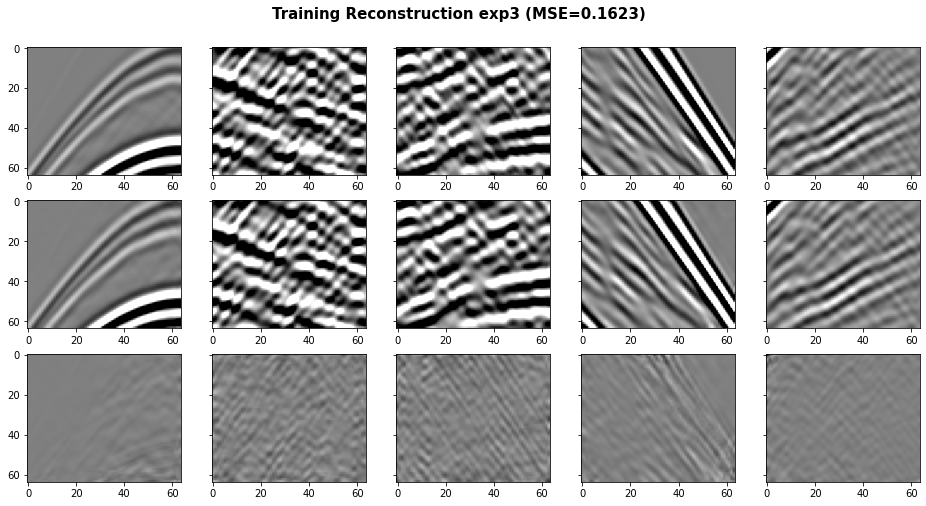

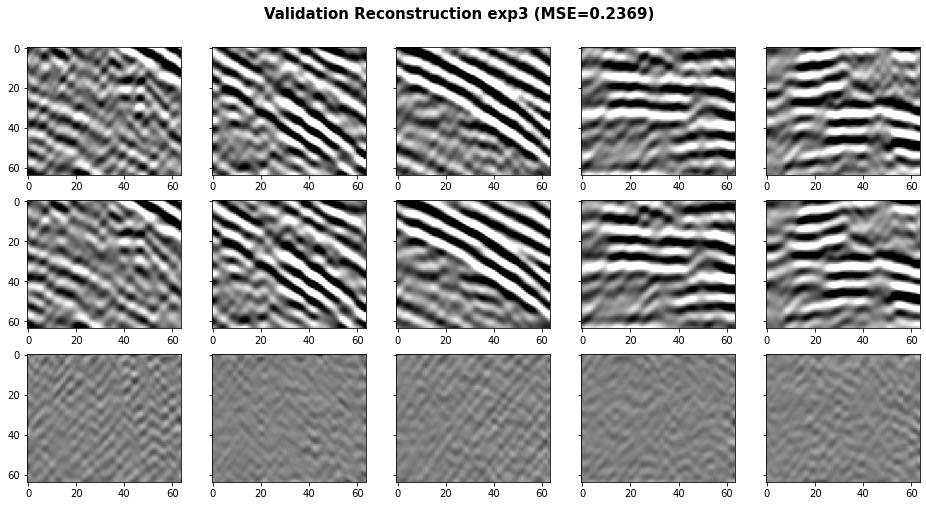

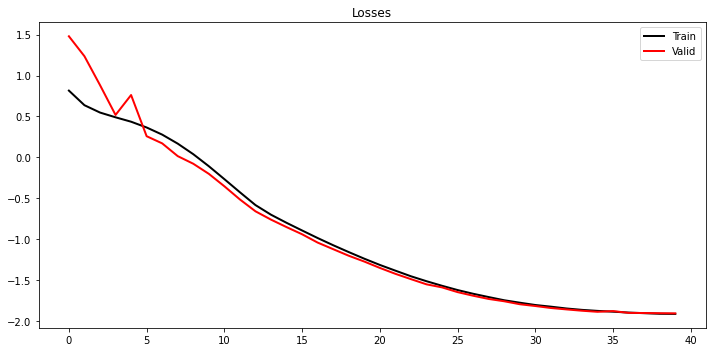

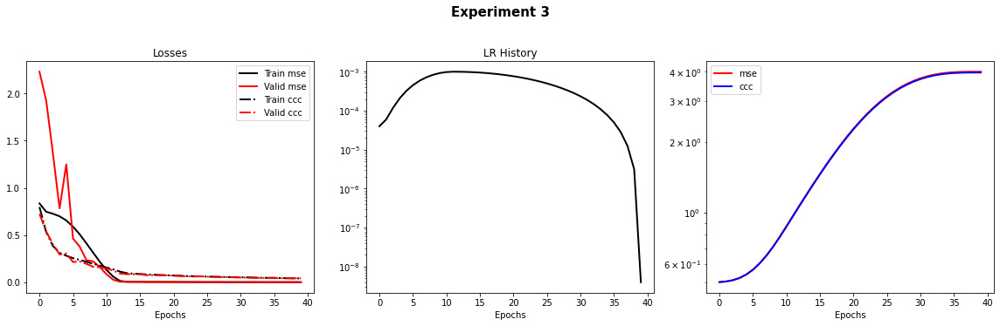

In [13]:
# Predict by manually piping encoder and decoder and visualize
mod.model.eval()

nstats = 100
nviz = 5
cmax = 0.3

x_train_latent = torch.from_numpy(x_train[:nstats].astype(np.float32)).view(nstats, 1, nspatch, ntpatch).to(device)
latent = mod.model.encode(x_train_latent)
x_train_ae = mod.model.decode(latent)
x_train_mse = np.linalg.norm(x_train[:nstats].ravel() - x_train_ae[:nstats].detach().cpu().numpy().ravel()) / nstats
fig, axs = plt.subplots(3, nviz, sharey=True, figsize=(16, 8))
plt.suptitle(f'Training Reconstruction exp{iexp} (MSE={x_train_mse:.4f})',
             y=0.95, fontsize=15, fontweight='bold')
for i in range(nviz):
    # display original
    axs[0, i].imshow(x_train[i].reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[0, i].axis('tight')
    # display reconstruction
    axs[1, i].imshow(x_train_ae[i].cpu().detach().numpy().reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[1, i].axis('tight')
    # display error
    axs[2, i].imshow(x_train[i].reshape(nspatch, ntpatch).T - 
                     x_train_ae[i].cpu().detach().numpy().reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[2, i].axis('tight')
plt.savefig(os.path.join(figdir, 'exp%d_train.png' % iexp))


x_valid_latent = torch.from_numpy(x_valid[:nstats].astype(np.float32)).view(nstats, 1, nspatch, ntpatch).to(device)
latent1 = mod.model.encode(x_valid_latent)
x_valid_ae = mod.model.decode(latent1)
x_valid_mse = np.linalg.norm(x_valid[:nstats].ravel() - x_valid_ae[:nstats].detach().cpu().numpy().ravel()) / nstats

fig, axs = plt.subplots(3, nviz, sharey=True, figsize=(16, 8))
plt.suptitle(f'Validation Reconstruction exp{iexp} (MSE={x_valid_mse:.4f})',
             y=0.95, fontsize=15, fontweight='bold')
for i in range(nviz):
    # display original
    axs[0, i].imshow(x_valid[i].reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[0, i].axis('tight')
    # display reconstruction
    axs[1, i].imshow(x_valid_ae[i].cpu().detach().numpy().reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[1, i].axis('tight')
    # display error
    axs[2, i].imshow(x_valid[i].reshape(nspatch, ntpatch).T - 
                     x_valid_ae[i].cpu().detach().numpy().reshape(nspatch, ntpatch).T, cmap='gray', 
                     vmin=-cmax, vmax=cmax)
    axs[2, i].axis('tight')
plt.savefig(os.path.join(figdir, 'exp%d_valid.png' % iexp))


# Display training losses
if not loadmodel:
    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    ax.plot(mod.train_loss_history, 'k', lw=2, ms=10, label='Train')
    ax.plot(mod.valid_loss_history, 'r', lw=2, ms=10, label='Valid')
    ax.set_title('Losses')
    ax.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(figdir, 'exp%d_trainingvalidhistory.png' % iexp))

    if isinstance(mod.lossfunc, list):
        fig, axs = plt.subplots(1, 3 if lossweights is None else 2, figsize=(16, 5))
        fig.suptitle('Experiment %s' % iexp, y=1.03, fontsize=15, fontweight='bold')
        ls = ['-', '-.', '--']
        for iloss, lossname in enumerate(mod.losses_names):
            axs[0].plot(mod.train_losses_history[lossname], 'k', lw=2, ms=10, 
                    linestyle=ls[iloss], label='Train %s' % lossname)
            axs[0].plot(mod.valid_losses_history[lossname], 'r', lw=2, ms=10,
                    linestyle=ls[iloss], label='Valid %s' % lossname)
            axs[0].set_title('Losses')
        axs[0].legend()
        axs[0].set_xlabel('Epochs')

        axs[1].semilogy(mod.lr_history, 'k', lw=2, ms=10)
        axs[1].set_title('LR History')
        axs[1].set_xlabel('Epochs')

        if lossweights is None:
            cols = ['r', 'b', 'g', 'y']
            for lossname, col in zip(mod.lossweights_history.keys(), cols):
                axs[2].semilogy(mod.lossweights_history[lossname], col, lw=2, ms=10, label=lossname)
            axs[2].legend()
            axs[2].set_xlabel('Epochs')
            fig.tight_layout()
            plt.savefig(os.path.join(figdir, 'exp%d_lrhistory.png' % iexp), bbox_inches='tight')

## Deghosting

In [14]:
print('Deghosting...')
mod.model.train()
mod.model.eval()

# Initial guess
patchesmask = Pop.H * dmask.ravel()
patchesmask = patchesmask.reshape(npatches[0]*npatches[1], 1, nspatch, ntpatch)
patchesmask_scaled = patchesmask / scalings.cpu().detach().numpy()
p0 = mod.model.encode(torch.from_numpy(patchesmask_scaled.astype(np.float32)).to(device)).cpu().detach().numpy()

# Invert
inv = InvertAll(device, # device
                mod.nenc, npatches[0] * npatches[1],
                mod.model, mod.model.patched_restricted_decode, mod.model.patched_decode, # modelling ops
                nn.MSELoss(), 1., 80, # optimizer
                reg_ae=0., x0=p0, bounds=None
                )
minv, pinv = inv.scipy_invert(d_torch, torch.zeros(((nr, nt))).to(device))

# Recompute data from minv
if 'cuda' in str(device):
    dinv = cp.asnumpy(Dupop * cp.asarray(minv))
else:
    dinv = Dupop * minv

minv = minv.reshape(ns, nt)
dinv = dinv.reshape(ns, nt)

Deghosting...


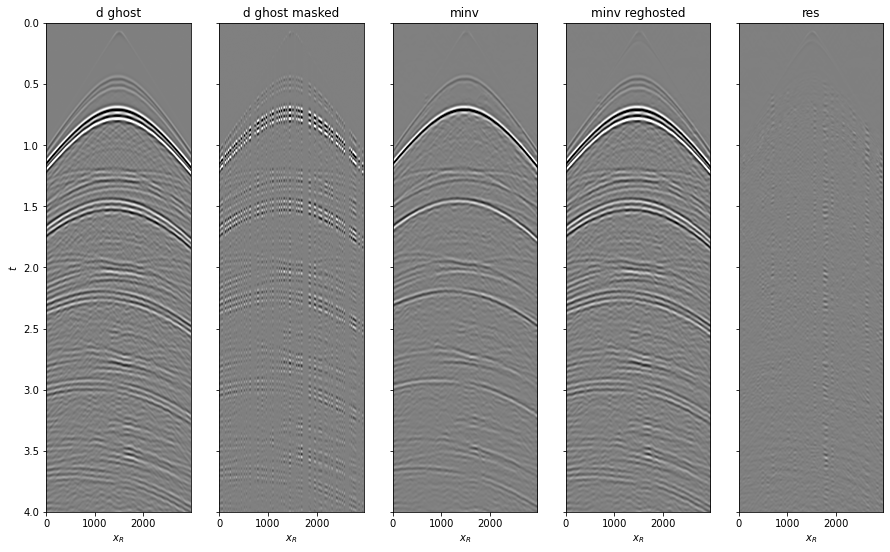

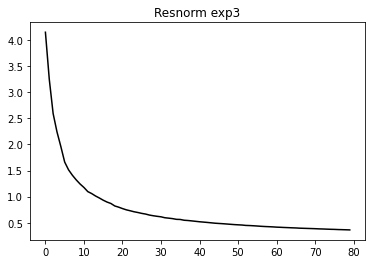

In [15]:
# Visualize
cmax = .2
pad = 4
tgain = np.exp(0.5*t)

fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 9))
axs[0].imshow(dfull[pad:-pad].T * tgain[:, np.newaxis], cmap='gray', vmin=-cmax, vmax=cmax,
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[0].set_title('d ghost')
axs[0].set_xlabel(r'$x_R$')
axs[0].set_ylabel(r'$t$')
axs[0].axis('tight')
axs[1].imshow(dmask[pad:-pad].T * tgain[:, np.newaxis], cmap='gray', vmin=-cmax, vmax=cmax,
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[1].set_title('d ghost masked')
axs[1].set_xlabel(r'$x_R$')
axs[1].axis('tight')
axs[2].imshow(minv[pad:-pad].T * tgain[:, np.newaxis], cmap='gray', vmin=-cmax, vmax=cmax,
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[2].set_title('minv')
axs[2].set_xlabel(r'$x_R$')
axs[2].axis('tight')
axs[3].imshow(dinv[pad:-pad].T * tgain[:, np.newaxis], cmap='gray',  vmin=-cmax, vmax=cmax,
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[3].set_title('minv reghosted')
axs[3].set_xlabel(r'$x_R$')
axs[3].axis('tight')
axs[4].imshow((dfull[pad:-pad].T-dinv[pad:-pad].T ) * tgain[:, np.newaxis], cmap='gray', vmin=-cmax, vmax=cmax,
              extent=(r[0,0], r[0,-1], t[-1], t[0]))
axs[4].set_title('res')
axs[4].set_xlabel(r'$x_R$')
axs[4].axis('tight')
axs[4].set_ylim(4, 0)
plt.savefig(os.path.join(figdir, f'exp{iexp}_deghosting.png'))

plt.figure()
plt.plot(inv.resnorm, 'k')
plt.title(f'Resnorm exp{iexp}');